# FEATURISATION & MODEL TUNING
- **DOMAIN:** Semiconductor manufacturing process
- **CONTEXT:** A complex modern semiconductor manufacturing process is normally under constant surveillance via the monitoring of signals/variables collected from sensors and or process measurement points. However, not all of these signals are equally valuable in a specific monitoring system. The measured signals contain a combination of useful information, irrelevant information as well as noise. Engineers typically have a much larger number of signals than are actually required. If we consider each type of signal as a feature, then feature selection may be applied to identify the most relevant signals. The Process Engineers may then use these signals to determine key factors contributing to yield excursions downstream in the process. This will enable an increase in process throughput, decreased time to learning and reduce the per unit production costs. These signals can be used as features to predict the yield type. And by analysing and trying out different combinations of features, essential signals that are impacting the yield type can be identified.
- **DATA DESCRIPTION:** signal-data.csv : (1567, 592)
The data consists of 1567 datapoints each with 591 features. The dataset presented in this case represents a selection of such features where each example represents a single production entity with associated measured features and the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” corresponds to a pass and “1” corresponds to a fail and the data time stamp is for that specific test point.
- **PROJECT OBJECTIVE:** We will build a classifier to predict the Pass/Fail yield of a particular process entity and analyse whether all the features are required to build the model or not.

In [1]:
import numpy as np

import pandas as pd

#

import warnings; warnings.simplefilter('ignore')

# 
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"

#
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline


import plotly.express as px
pd.set_option('display.float_format', lambda x: '%.2f' % x) # To supress numerical display in scientific notations

In [2]:
df=pd.read_csv('signal-data.csv')
df_orig=df.copy(deep=True)

In [3]:
df_row,df_col=df.shape
print('no. of rows = ',df_row)
print('no. of columns = ',df_col)

no. of rows =  1567
no. of columns =  592


In [4]:
df.head()

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.73,1411.13,1.36,100.00,97.61,0.12,1.50,...,NaN,0.50,0.01,0.00,2.36,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.42,1463.66,0.83,100.00,102.34,0.12,1.50,...,208.20,0.50,0.02,0.01,4.44,0.01,0.02,0.01,208.20,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.41,1698.02,1.51,100.00,95.49,0.12,1.44,...,82.86,0.50,0.02,0.00,3.17,0.06,0.05,0.01,82.86,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.03,909.79,1.32,100.00,104.24,0.12,1.49,...,73.84,0.50,0.01,0.00,2.05,0.02,0.01,0.00,73.84,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.37,1326.52,1.53,100.00,100.40,0.12,1.50,...,NaN,0.48,0.48,0.10,99.30,0.02,0.01,0.00,73.84,-1


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1561.00,3014.45,73.62,2743.24,2966.26,3011.49,3056.65,3356.35
1,1560.00,2495.85,80.41,2158.75,2452.25,2499.40,2538.82,2846.44
2,1553.00,2200.55,29.51,2060.66,2181.04,2201.07,2218.06,2315.27
3,1553.00,1396.38,441.69,0.00,1081.88,1285.21,1591.22,3715.04
4,1553.00,4.20,56.36,0.68,1.02,1.32,1.53,1114.54
...,...,...,...,...,...,...,...,...
586,1566.00,0.02,0.01,-0.02,0.01,0.02,0.03,0.10
587,1566.00,0.02,0.01,0.00,0.01,0.01,0.02,0.08
588,1566.00,0.01,0.00,0.00,0.00,0.00,0.01,0.03
589,1566.00,99.67,93.89,0.00,44.37,71.90,114.75,737.30


In [7]:
df.dtypes.value_counts()

float64    590
object       1
int64        1
dtype: int64

In [8]:
df.select_dtypes(include='object').columns

Index(['Time'], dtype='object')

In [9]:
df.select_dtypes(include='int').columns

Index(['Pass/Fail'], dtype='object')

In [10]:
df.isnull().sum()

Time          0
0             6
1             7
2            14
3            14
             ..
586           1
587           1
588           1
589           1
Pass/Fail     0
Length: 592, dtype: int64

([<matplotlib.patches.Wedge at 0x1a0e96fcb20>,
 [Text(-1.07617584854945, 0.22769616377724036, 'Pass'),
  Text(1.076175832560607, -0.22769623934638117, 'Fail')],
 [Text(-0.5870050082996998, 0.12419790751485836, '93.36%'),
  Text(0.5870049995785128, -0.12419794873438972, '6.64%')])

Text(0.5, 1.0, 'Results Pie-Chart')

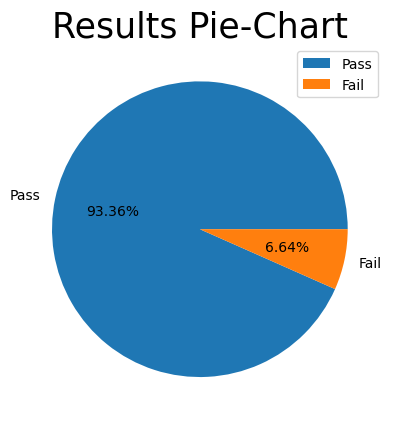

In [11]:
labels = ['Pass', 'Fail']
val = df['Pass/Fail'].value_counts()
plt.pie(val, labels =labels, autopct = "%.2f%%")
plt.title('Results Pie-Chart', fontsize = 25)
plt.legend()
plt.show()

In [12]:
#Printing the five point summary of all the numerical columns of the dataframe
for idx, column in enumerate(df.columns):
    if df[column].dtype != 'object':    
        print('\033[1mThe Five Point Summary of \'{0}\' column: \033[0m'.format(column))
        print('Minimum Value of column {0} = {1}'.format(column,df[column].min()))
        print('Q1 Value of column {0} = {1}'.format(column,df[column].quantile(0.25)))
        print('Median Value of column {0} = {1}'.format(column,df[column].quantile(0.5)))
        print('Q3 Value of column {0} = {1}'.format(column,df[column].quantile(0.75)))
        print('Maximum Value of column {0} = {1}'.format(column,df[column].max()))
        print('\nIn Addition to these, the mean and standard devition for the feature are as below:')
        print('Mean Value of column {0} = {1}'.format(column,df[column].mean()))
        print('Standard Deviation Value of column {0} = {1}'.format(column,df[column].std()))
        print('\n')

The Five Point Summary of '0' column: 
Minimum Value of column 0 = 2743.24
Q1 Value of column 0 = 2966.26
Median Value of column 0 = 3011.49
Q3 Value of column 0 = 3056.65
Maximum Value of column 0 = 3356.35

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 0 = 3014.4528955797564
Standard Deviation Value of column 0 = 73.62178674853081


The Five Point Summary of '1' column: 
Minimum Value of column 1 = 2158.75
Q1 Value of column 1 = 2452.2475000000004
Median Value of column 1 = 2499.4049999999997
Q3 Value of column 1 = 2538.8225
Maximum Value of column 1 = 2846.44

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 1 = 2495.850230769231
Standard Deviation Value of column 1 = 80.40770497881124


The Five Point Summary of '2' column: 
Minimum Value of column 2 = 2060.66
Q1 Value of column 2 = 2181.0444
Median Value of column 2 = 2201.0667
Q3 Value of column 2 = 2218.0555
Maximum V

Median Value of column 97 = 0.0
Q3 Value of column 97 = 0.0
Maximum Value of column 97 = 0.0

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 97 = 0.0
Standard Deviation Value of column 97 = 0.0


The Five Point Summary of '98' column: 
Minimum Value of column 98 = -5.2717
Q1 Value of column 98 = -0.2188
Median Value of column 98 = 0.0
Q3 Value of column 98 = 0.1893
Maximum Value of column 98 = 2.5698

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 98 = -0.018142664958360026
Standard Deviation Value of column 98 = 0.4271097858463494


The Five Point Summary of '99' column: 
Minimum Value of column 99 = -0.5283
Q1 Value of column 99 = -0.0298
Median Value of column 99 = 0.0
Q3 Value of column 99 = 0.0298
Maximum Value of column 99 = 0.8854

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 99 = 0.001540102498398463
Standar

Q1 Value of column 189 = 0.0
Median Value of column 189 = 0.0
Q3 Value of column 189 = 0.0
Maximum Value of column 189 = 0.0

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 189 = 0.0
Standard Deviation Value of column 189 = 0.0


The Five Point Summary of '190' column: 
Minimum Value of column 190 = 0.0
Q1 Value of column 190 = 0.0
Median Value of column 190 = 0.0
Q3 Value of column 190 = 0.0
Maximum Value of column 190 = 0.0

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 190 = 0.0
Standard Deviation Value of column 190 = 0.0


The Five Point Summary of '191' column: 
Minimum Value of column 191 = 0.0
Q1 Value of column 191 = 0.0
Median Value of column 191 = 0.0
Q3 Value of column 191 = 0.0
Maximum Value of column 191 = 0.0

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 191 = 0.0
Standard Deviation Value of column 1

Median Value of column 252 = 2.8646
Q3 Value of column 252 = 3.79505
Maximum Value of column 252 = 2549.9885

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 252 = 4.645114869176771
Standard Deviation Value of column 252 = 64.35475571189657


The Five Point Summary of '253' column: 
Minimum Value of column 253 = 0.0094
Q1 Value of column 253 = 0.0245
Median Value of column 253 = 0.0308
Q3 Value of column 253 = 0.0379
Maximum Value of column 253 = 0.4517

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 253 = 0.033216202203499676
Standard Deviation Value of column 253 = 0.022425105715950137


The Five Point Summary of '254' column: 
Minimum Value of column 254 = 0.0017
Q1 Value of column 254 = 0.0047
Median Value of column 254 = 0.015
Q3 Value of column 254 = 0.0213
Maximum Value of column 254 = 0.0787

In Addition to these, the mean and standard devition for the feature are as

Q1 Value of column 355 = 0.0212
Median Value of column 355 = 0.0294
Q3 Value of column 355 = 0.0423
Maximum Value of column 355 = 0.2789

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 355 = 0.03454309786130914
Standard Deviation Value of column 355 = 0.022306691777344116


The Five Point Summary of '356' column: 
Minimum Value of column 356 = 0.3796
Q1 Value of column 356 = 1.0254750000000001
Median Value of column 356 = 1.2553
Q3 Value of column 356 = 1.533325
Maximum Value of column 356 = 2.8348

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 356 = 1.298628607918263
Standard Deviation Value of column 356 = 0.38691760534773934


The Five Point Summary of '357' column: 
Minimum Value of column 357 = 0.0003
Q1 Value of column 357 = 0.0007
Median Value of column 357 = 0.0009
Q3 Value of column 357 = 0.0011
Maximum Value of column 357 = 0.0052

In Addition to these, the mean 

Q1 Value of column 459 = 2.291175
Median Value of column 459 = 2.83035
Q3 Value of column 459 = 3.3092249999999996
Maximum Value of column 459 = 47.7772

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 459 = 2.838380140485313
Standard Deviation Value of column 459 = 1.345576277967544


The Five Point Summary of '460' column: 
Minimum Value of column 460 = 7.9534
Q1 Value of column 460 = 20.22185
Median Value of column 460 = 26.16785
Q3 Value of column 460 = 35.278800000000004
Maximum Value of column 460 = 149.3851

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 460 = 29.197413601532567
Standard Deviation Value of column 460 = 13.33518889253988


The Five Point Summary of '461' column: 
Minimum Value of column 461 = 0.0
Q1 Value of column 461 = 0.0
Median Value of column 461 = 0.0
Q3 Value of column 461 = 0.0
Maximum Value of column 461 = 0.0

In Addition to these, the mean a

Q1 Value of column 568 = 1.8844
Median Value of column 568 = 1.9997
Q3 Value of column 568 = 2.97085
Maximum Value of column 568 = 12.7462

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 568 = 2.452416924265842
Standard Deviation Value of column 568 = 0.9966441742590848


The Five Point Summary of '569' column: 
Minimum Value of column 569 = 3.2504
Q1 Value of column 569 = 15.4662
Median Value of column 569 = 16.98835
Q3 Value of column 569 = 24.772175
Maximum Value of column 569 = 84.8024

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 569 = 21.11767403400309
Standard Deviation Value of column 569 = 10.213294338381706


The Five Point Summary of '570' column: 
Minimum Value of column 570 = 317.1964
Q1 Value of column 570 = 530.7027
Median Value of column 570 = 532.3982
Q3 Value of column 570 = 534.3564
Maximum Value of column 570 = 589.5082

In Addition to these, the mean 

**Observations**
- The dataframe contains 1567 rows and 592 columns
- 591 columns are numeric (590 with data type float and 1 as integer) and 1 column is object type
- The dataframe describes time series data produced by the monitoring system
- There are many columns having standard deviation as 0. That is they have same value across all timestamps
- The signal parameters are of type float, and the result column (Pass/Fail) is of type integer
- 93.36% of the results are Pass, with remaining 6.64% being fail
- There are missing values in several columns

**Dropping the columns having more than 20% null values**

In [13]:
for idx, column in enumerate(df.columns):
    if(df[column].isnull().sum()/df_row)>=0.2: #identify the columns which have 20% or more null values
        df.drop(column,axis=1,inplace=True)    #dropping the identified columns

In [14]:
df.shape

(1567, 560)

**Imputing Null values in remaining columns with mean value of the column**

In [15]:
for idx, column in enumerate(df.columns):
    if column != 'Time':
        df[column].fillna(df[column].mean(), inplace=True)

In [16]:
n=0
for idx, column in enumerate(df.columns):
    if df[column].isnull().sum() != 0:
        print('Column {} still has Null values'.format(column))
        n+=1
if n == 0:
    print('There are no null values in the dataframe')

There are no null values in the dataframe


In [17]:
for idx, column in enumerate(df.columns):
    if df[column].nunique() == 1: #identify the columns which has same value across all rows
        df.drop(column,axis=1,inplace=True)    #dropping the identified columns

In [18]:
df.shape

(1567, 444)

**We'll drop the 'Time' feature from the dataframe as it is not required for Supervised Learning Algorithms or dimensionality reduction**

In [19]:
df.drop('Time',axis=1,inplace=True)

In [20]:
corr_mat=df.corr()

In [21]:
# Selecting upper triangle of correlation matrix
low_triangle = corr_mat.where(np.tril(np.ones(corr_mat.shape), k=-1).astype(bool))
low_triangle

,0,1,2,3,4,6,7,8,9,10,...,577,582,583,584,585,586,587,588,589,Pass/Fail
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.00,0.01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.01,-0.01,0.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.01,-0.00,0.10,-0.06,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
586,0.02,-0.01,-0.03,0.03,-0.04,-0.04,0.06,0.01,0.03,0.00,...,-0.00,-0.02,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN
587,-0.03,0.02,-0.03,-0.04,-0.03,0.03,-0.02,0.02,0.06,0.05,...,-0.01,-0.02,-0.00,-0.00,-0.00,0.17,NaN,NaN,NaN,NaN
588,-0.03,0.01,-0.03,-0.03,-0.03,0.03,-0.02,0.03,0.06,0.05,...,-0.02,-0.02,-0.00,-0.00,-0.00,0.16,0.97,NaN,NaN,NaN
589,0.00,0.04,-0.03,-0.08,0.05,0.04,-0.11,-0.02,0.00,0.01,...,-0.02,0.04,-0.00,-0.00,-0.00,-0.49,0.39,0.39,NaN,NaN


**Inspecting the high correlation columns with correlation value greater than 0.9 or less than -0.9**

In [22]:
high_corr1 = []
high_corr2 = []
for idx,column in enumerate(low_triangle.columns):
    if any(low_triangle[column] < -0.9):
        high_corr1.append(column)
    if any(low_triangle[column] > 0.9):
        high_corr2.append(column)
print('Columns having correlation with other feature between -1 and -0.9 are:\n',high_corr1)
print('Columns having correlation with other feature between 0.9 and 1 are:\n',high_corr2)
print('Number of Columns having correlation with other feature between -1 and -0.9 are:\n',len(high_corr1))
print('Number of Columns having correlation with other feature between 0.9 and 1 are:\n',len(high_corr2))

Columns having correlation with other feature between -1 and -0.9 are:
 ['34', '92', '93', '94', '99']
Columns having correlation with other feature between 0.9 and 1 are:
 ['4', '16', '25', '46', '53', '66', '67', '74', '98', '114', '117', '121', '122', '135', '136', '137', '138', '139', '140', '142', '143', '144', '145', '146', '147', '148', '150', '151', '152', '153', '154', '155', '156', '159', '160', '161', '162', '163', '164', '165', '166', '167', '168', '169', '170', '171', '172', '173', '174', '175', '176', '177', '180', '181', '182', '183', '184', '185', '187', '188', '195', '196', '197', '198', '199', '201', '202', '203', '204', '205', '206', '207', '208', '209', '210', '211', '212', '213', '214', '215', '216', '217', '218', '219', '221', '222', '223', '224', '225', '227', '228', '238', '239', '248', '249', '250', '251', '252', '253', '254', '255', '267', '268', '269', '270', '271', '272', '273', '275', '277', '278', '279', '282', '283', '286', '287', '288', '289', '290', '29

**We see there are large number of columns with high correlation values. To remove multi-Collinearity we'll drop these columns**

In [23]:
drop=high_corr1+high_corr2
df.drop(drop,axis=1,inplace=True)
df.shape

(1567, 248)

**We'll analyze the outliers in the features**

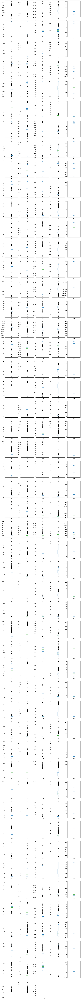

In [24]:
_=df.plot(kind='box', layout=(50,5), subplots=True, figsize=(15,200))

**We see there are outliers in most of the features. We'll apply outlier treatment for the features, to impute the ouliers with median values of their respective columns**

In [25]:
from scipy import stats

#Defining a function to remove outliers on the higher side
def outlier_high(val):
    val = np.where(val > (val.quantile(0.75) + (1.5*stats.iqr(val))),val.quantile(0.50),val)
    return val

#Defining a function to remove outliers on the lower side
def outlier_low(val):
    val = np.where(val < (val.quantile(0.25) - (1.5*stats.iqr(val))),val.quantile(0.50),val)
    return val


for column in df.columns:
    if column != 'Pass/Fail':
        df[column] = outlier_high(df[column])
        df[column] = outlier_low(df[column])

**Checking for null values in the dataset**

In [26]:
df.isnull().sum().sum()

0

**Checking for duplicated rows in the dataset**

In [27]:
df.duplicated().sum()

0

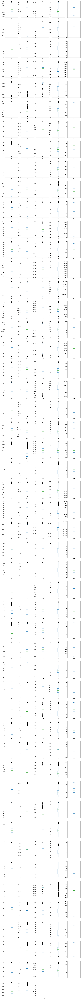

In [28]:
#Boxplot of the features after outlier treatment
_=df.plot(kind='box', layout=(50,5), subplots=True, figsize=(15,200))

**We still see some outliers in some of the features. This is because after outlier treatment the distribution of the features has changed and values which were not outliers earlier have moved out of the upper or lower whiskers**

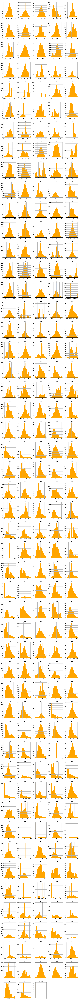

In [29]:
#Histplot of the features
_=df.hist(bins = 25, figsize = (15,200), color = 'orange', layout=(50,5))
plt.show()

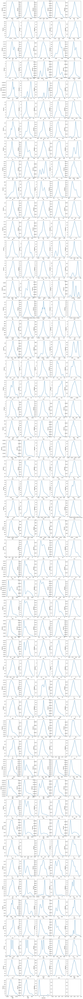

In [30]:
fig, axes = plt.subplots(nrows=50,ncols=5,figsize=(15,200));
j=0
for i in df.columns:    
    sns.kdeplot(data=df,x=i,ax=axes[j//5,j%5])    
    j+=1
plt.show();

**We can observe the following from the Histplot and kdeplot**
- Most of the features exhibit normal distribution
- There are a few features which show bimodal distribution. For ex. 12,18,21,22, 26, 27, 47 etc.
- There are few others which show multimodal distribution. For ex. 17, 51, 95, etc.


**Heatmap**

<Axes: >

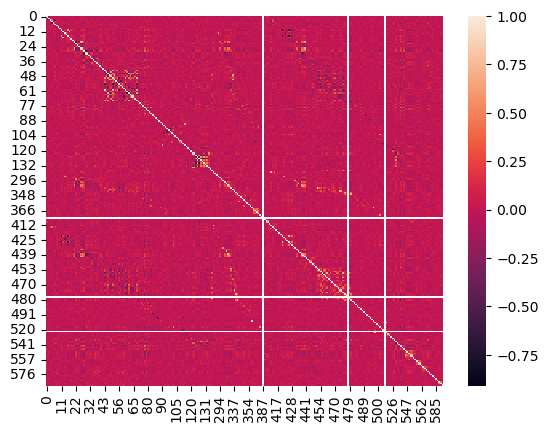

In [31]:
sns.heatmap(df.corr())

**Since we have removed multi-Collinear featutes we dont see highly correlated features**

**Histplot with Pass/Fail indicator**

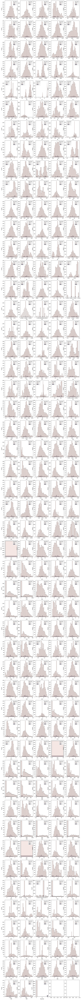

In [32]:
fig, axes = plt.subplots(nrows=50,ncols=5,figsize=(15,200));
j=0
for i in df.columns:    
    sns.histplot(data=df,x=i,ax=axes[j//5,j%5],hue='Pass/Fail')    
    j+=1
plt.show();

**Boxplot based on Result (Pass/Fail)**

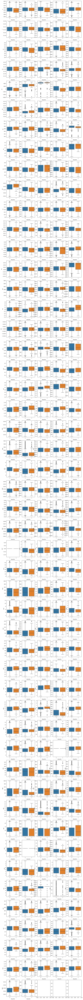

In [33]:
fig, axes = plt.subplots(nrows=50,ncols=5,figsize=(15,200));
j=0
for i in df.columns:
    if i != 'Pass/Fail':
        sns.boxplot(data=df,y=i,ax=axes[j//5,j%5],x='Pass/Fail')    
    j+=1
plt.show();

**Jointplot between bimodal and multi-modal features**

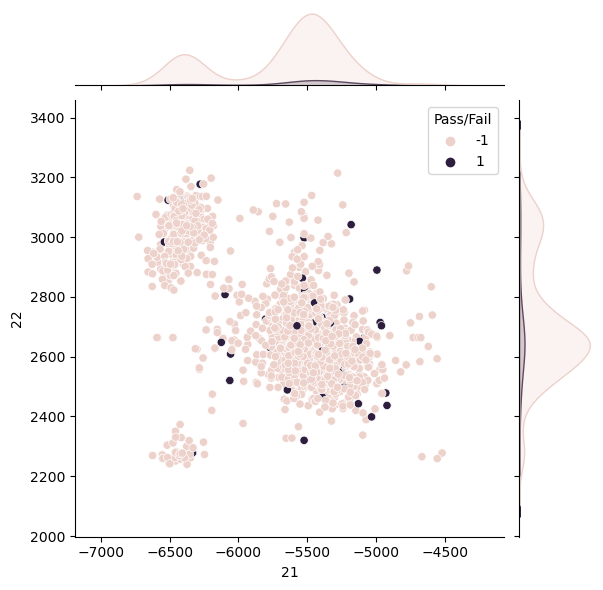

In [34]:
sns.jointplot(data=df,x="21", y="22", hue="Pass/Fail");

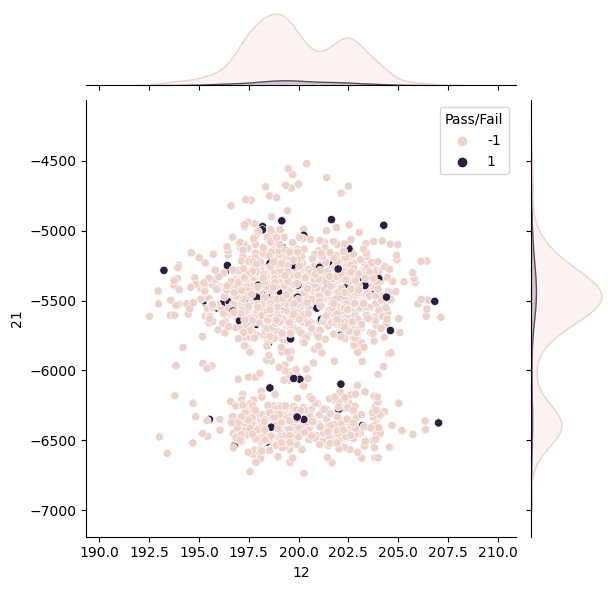

In [35]:
sns.jointplot(data=df,x="12", y="21", hue="Pass/Fail");

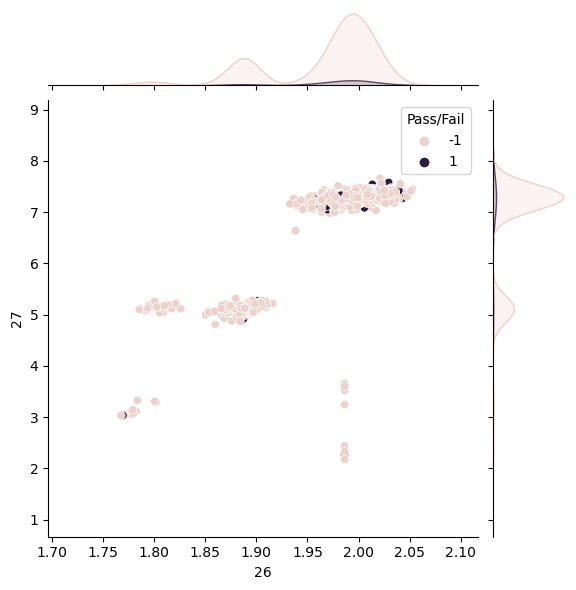

In [36]:
sns.jointplot(data=df,x="26", y="27", hue="Pass/Fail");

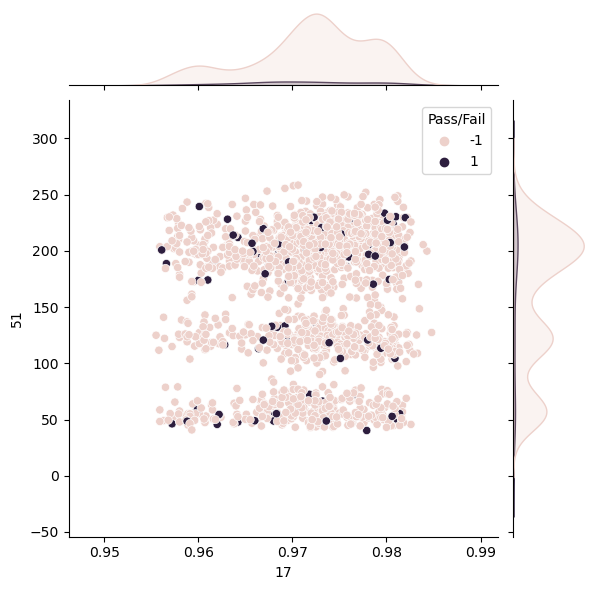

In [37]:
sns.jointplot(data=df,x="17", y="51", hue="Pass/Fail");

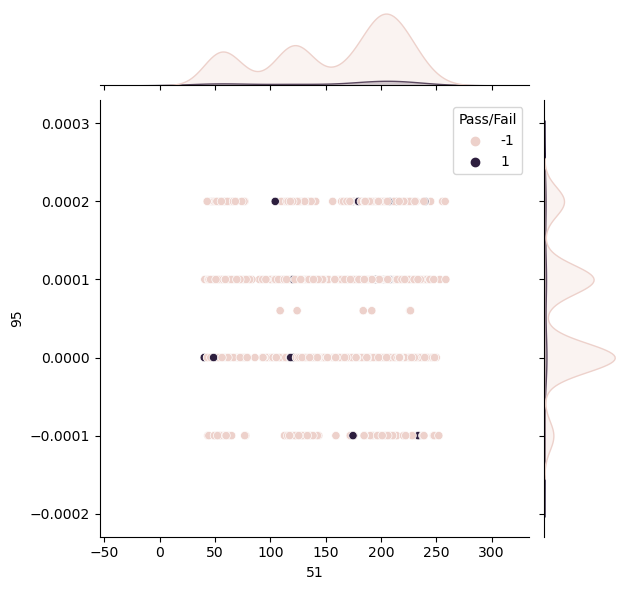

In [38]:
sns.jointplot(data=df,x="51", y="95", hue="Pass/Fail");

**Observations from Histplot differentiated by the result 'Pass/Fail':**
- The results Pass or Fail are similarly distributed across the features values
- The features which have normal distribution, we see both Pass and Fail are distributed normally
- In case of bimodally distributed features, both Pass and Fail have bimodal distribution
- In case of multi-modal distributed features as well, both Pass and Fail have multi-modal distribution

**Observations from Boxplot differentiated by the result 'Pass/Fail':**
- After doing the outlier treatment on the dataset, the number of outliers have reduced
- But still there are outliers in few of the features, as the distribution of features has changed after outlier treatment
- These outliers are present for both Pass and Fail results, with fewer outliers in case of Fail result. This is because the number of Fail cases itself are very low compared to Pass cases

**Observations from Heatmap:**
- There are no more highly correlated features in the dataset

**Observations from Jointplot**
- Based on the jointplots we can see that there is no or very low correlation between the selected columns
- The jointplot also displays the distribution of the features. We can see that the selected features have bimodal or multi-modal distribution

**We'll change the labels for Pass and fail from -1 and 1 TO 0 and 1 respectively for better interpretability**

In [39]:
#label encoding the target class
df['Pass/Fail']=df['Pass/Fail'].replace([-1,1],[0,1])

In [40]:
df['Pass/Fail'].value_counts()

0    1463
1     104
Name: Pass/Fail, dtype: int64

In [41]:
df.shape

(1567, 248)

In [42]:
X=df.drop(['Pass/Fail'],axis=1)
y=df[['Pass/Fail']]
X.shape
y.shape

(1567, 247)

(1567, 1)

**Predictores and target attributes are segregated, with dataframe X holding the predictors are y having the target variable**

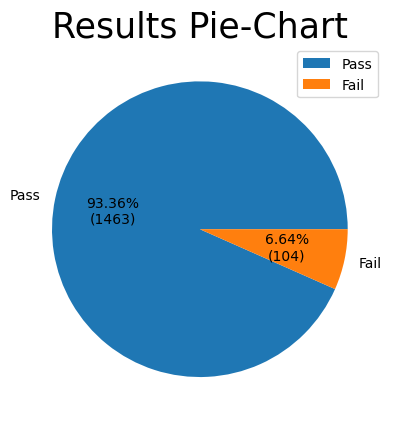

In [43]:
labels = ['Pass', 'Fail']
total = df['Pass/Fail'].value_counts().values.sum()
def fmt(x):#Defining function to include the count and percentage of the labels in the pie-chart
    return '{:.2f}%\n({:.0f})'.format(x, total*x/100);
val = df['Pass/Fail'].value_counts()
_=plt.pie(x=val, labels =labels, autopct=fmt)
_=plt.title('Results Pie-Chart', fontsize = 25)
_=plt.legend()
_=plt.show()

**The dataset is highly imbalanced. We'll upsample the dataset using SMOTE technique. But before applying SMOTE we'll split the X and Y variables into Train and Test dataset, as SMOTE should be applied only on the train data**

In [44]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .3, random_state=10) #Splitting with 30% of data for Test

**Before SMOTE**

In [45]:
print('Number of entries in training data with result Pass (0) are: {0} which is {1:.2f}% of entries'.format(y_train.value_counts()[0],y_train.value_counts()[0]*100/len(y_train)))
print('Number of entries in training data with result Fail (1) are: {0} which is {1:.2f}% of entries'.format(y_train.value_counts()[1], y_train.value_counts()[1]*100/len(y_train)))

Number of entries in training data with result Pass (0) are: 1021 which is 93.16% of entries
Number of entries in training data with result Fail (1) are: 75 which is 6.84% of entries


**Applying SMOTE on Train data**

In [46]:
from imblearn.over_sampling import SMOTE
sm=SMOTE(sampling_strategy = 'auto' ,k_neighbors = 20, random_state=10)

#from imblearn.combine import SMOTETomek
#sm=SMOTETomek()
X_sm_train,y_sm_train=sm.fit_resample(X_train,y_train) #Oversampling Training dataset using SMOTE

**After SMOTE**

In [47]:
print('Number of entries in training data with result Pass (0) are: {0} which is {1:.2f}% of entries'.format(y_sm_train.value_counts()[0],y_sm_train.value_counts()[0]*100/len(y_sm_train)))
print('Number of entries in training data with result Fail (1) are: {0} which is {1:.2f}% of entries'.format(y_sm_train.value_counts()[1], y_sm_train.value_counts()[1]*100/len(y_sm_train)))

Number of entries in training data with result Pass (0) are: 1021 which is 50.00% of entries
Number of entries in training data with result Fail (1) are: 1021 which is 50.00% of entries


**Train-Test split is already done as part of 4.B. Now we'll standardise the data with MinMaxScalar**

**We'll use MinMaxScalar to fit on the training data, and then use it to transform the train and test data. We will not fit the scalar function on entire data to avoid data leak**

In [48]:
X_test.values

array([[3.0187800e+03, 2.5208800e+03, 2.2024556e+03, ..., 1.8400000e-02,
        5.4000000e-03, 8.0175900e+01],
       [2.9819500e+03, 2.4989100e+03, 2.2052889e+03, ..., 1.2300000e-02,
        2.6000000e-03, 7.6458400e+01],
       [2.9692900e+03, 2.5585600e+03, 2.1558556e+03, ..., 8.0000000e-03,
        8.8000000e-03, 7.2023000e+01],
       ...,
       [3.0580800e+03, 2.5246000e+03, 2.1923778e+03, ..., 2.1800000e-02,
        2.0000000e-03, 2.4654700e+01],
       [3.0420800e+03, 2.4989100e+03, 2.2065112e+03, ..., 2.0100000e-02,
        7.5000000e-03, 1.0783310e+02],
       [3.0768100e+03, 2.5212500e+03, 2.1955000e+03, ..., 3.8800000e-02,
        4.6000000e-03, 8.8744300e+01]])

In [49]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler().fit(X_sm_train)
X_sm_train_scaled = scaler.transform(X_sm_train) 
X_test_scaled = scaler.transform(X_test) 

In [50]:
X_test_scaled

array([[0.50102985, 0.56287642, 0.52785548, ..., 0.44852941, 0.44897959,
        0.3643733 ],
       [0.39418642, 0.49671766, 0.54758597, ..., 0.33639706, 0.16326531,
        0.34747848],
       [0.35745989, 0.67634305, 0.20334317, ..., 0.25735294, 0.79591837,
        0.32732103],
       ...,
       [0.61503873, 0.57407854, 0.45767587, ..., 0.51102941, 0.10204082,
        0.11204757],
       [0.5686229 , 0.49671766, 0.5560978 , ..., 0.47977941, 0.66326531,
        0.49006625],
       [0.66937426, 0.5639906 , 0.47941819, ..., 0.82352941, 0.36734694,
        0.40331389]])

**We'll print the five point summary of the original dataframe (from which the Train and Test set was extracted) and the Train and Test set (before SMOTE and scaling)**

In [51]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1567.00,3010.12,61.56,2846.07,2968.56,3011.84,3051.84,3190.97
1,1567.00,2497.42,58.96,2332.39,2460.10,2498.91,2534.32,2666.04
2,1567.00,2201.00,25.68,2126.66,2183.06,2200.96,2217.58,2270.26
3,1567.00,1345.71,334.30,711.03,1084.38,1287.35,1551.69,2347.91
6,1567.00,101.46,4.42,88.66,98.85,101.49,104.20,113.88
...,...,...,...,...,...,...,...,...
585,1567.00,2.78,0.64,1.20,2.31,2.76,3.16,4.74
586,1567.00,0.02,0.01,-0.01,0.01,0.02,0.03,0.05
588,1567.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01
589,1567.00,76.51,45.38,0.00,44.37,72.02,94.42,220.04


In [52]:
X_train.describe().T

,count,mean,std,min,25%,50%,75%,max
0,1096.00,3010.24,62.34,2846.07,2967.56,3011.84,3051.23,3190.78
1,1096.00,2498.45,58.56,2333.96,2461.76,2498.91,2536.50,2666.04
2,1096.00,2201.58,26.09,2126.66,2183.26,2201.07,2218.06,2270.26
3,1096.00,1344.86,327.67,711.03,1084.38,1287.35,1552.10,2347.91
6,1096.00,101.47,4.43,88.66,98.81,101.49,104.30,113.88
...,...,...,...,...,...,...,...,...
582,1096.00,0.50,0.00,0.49,0.50,0.50,0.50,0.51
585,1096.00,2.79,0.65,1.37,2.31,2.76,3.17,4.74
586,1096.00,0.02,0.01,-0.01,0.01,0.02,0.03,0.05
588,1096.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01


In [53]:
X_test.describe().T

,count,mean,std,min,25%,50%,75%,max
0,471.00,3009.83,59.77,2848.46,2971.00,3011.84,3053.23,3190.97
1,471.00,2495.02,59.88,2332.39,2456.45,2498.91,2528.89,2655.37
2,471.00,2199.66,24.68,2130.06,2182.22,2200.12,2215.10,2270.26
3,471.00,1347.67,349.60,711.03,1081.03,1283.44,1549.39,2341.78
6,471.00,101.46,4.39,89.49,98.90,101.49,104.15,113.43
...,...,...,...,...,...,...,...,...
582,471.00,0.50,0.00,0.49,0.50,0.50,0.50,0.51
585,471.00,2.76,0.61,1.20,2.31,2.74,3.13,4.71
586,471.00,0.02,0.01,-0.01,0.01,0.02,0.03,0.05
588,471.00,0.00,0.00,0.00,0.00,0.00,0.01,0.01


In [54]:
#Printing the five point summary for the original dataframe and the Train and Test dataset
for idx, column in enumerate(df.columns):
    if column != 'Pass/Fail':    
        print('\033[1mThe Five Point Summary of \'{0}\' column: \033[0m'.format(column))
        print('Minimum Value of column {0} in Original DF: \033[1m{1}\033[0m, Train DF \033[1m{2}\033[0m, Test DF: \033[1m{3}\033[0m'.
              format(column,df[column].min(),X_train[column].min(),X_test[column].min()))
        print('Q1 Value of column {0} in Original DF: \033[1m{1}\033[0m, Train DF \033[1m{2}\033[0m, Test DF: \033[1m{3}\033[0m'.
              format(column,df[column].quantile(0.25),X_train[column].quantile(0.25),X_test[column].quantile(0.25)))
        print('Median Value of column {0} in Original DF: \033[1m{1}\033[0m, Train DF \033[1m{2}\033[0m, Test DF: \033[1m{3}\033[0m'.
              format(column,df[column].quantile(0.5),X_train[column].quantile(0.5),X_test[column].quantile(0.5)))
        print('Q3 Value of column {0} in Original DF: \033[1m{1}\033[0m, Train DF \033[1m{2}\033[0m, Test DF: \033[1m{3}\033[0m'.
              format(column,df[column].quantile(0.75),X_train[column].quantile(0.75),X_test[column].quantile(0.75)))
        print('Maximum Value of column {0} in Original DF: \033[1m{1}\033[0m, Train DF \033[1m{2}\033[0m, Test DF: \033[1m{3}\033[0m'.
              format(column,df[column].max(),X_train[column].max(),X_test[column].max()))
        print('\nIn Addition to these, the mean and standard devition for the feature are as below:')
        print('Mean Value of column {0} in Original DF: \033[1m{1:.2f}\033[0m, Train DF \033[1m{2:.2f}\033[0m, Test DF: \033[1m{3:.2f}\033[0m'.
              format(column,df[column].mean(),X_train[column].mean(),X_test[column].mean()))
        print('Standard Deviation Value of column {0} in Original DF: \033[1m{1:.2f}\033[0m, Train DF \033[1m{2:.2f}\033[0m, Test DF: \033[1m{3:.2f}\033[0m'.
              format(column,df[column].std(),X_train[column].std(),X_test[column].std()))
        print('\n')

The Five Point Summary of '0' column: 
Minimum Value of column 0 in Original DF: 2846.07, Train DF 2846.07, Test DF: 2848.46
Q1 Value of column 0 in Original DF: 2968.5550000000003, Train DF 2967.5625, Test DF: 2971.0
Median Value of column 0 in Original DF: 3011.84, Train DF 3011.84, Test DF: 3011.84
Q3 Value of column 0 in Original DF: 3051.84, Train DF 3051.23, Test DF: 3053.23
Maximum Value of column 0 in Original DF: 3190.97, Train DF 3190.78, Test DF: 3190.97

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 0 in Original DF: 3010.12, Train DF 3010.24, Test DF: 3009.83
Standard Deviation Value of column 0 in Original DF: 61.56, Train DF 62.34, Test DF: 59.77


The Five Point Summary of '1' column: 
Minimum Value of column 1 in Original DF: 2332.39, Train DF 2333.96, Test DF: 2332.39
Q1 Value of column 1 in Original DF: 2460.0950000000003, Train DF 2461.76, Test DF: 2456.45
Median Value of column 1 in Original DF: 2498.91, Tra

Q1 Value of column 38 in Original DF: 86.5867, Train DF 86.5783, Test DF: 86.654
Median Value of column 38 in Original DF: 86.8207, Train DF 86.8196, Test DF: 86.8207
Q3 Value of column 38 in Original DF: 86.955, Train DF 86.955125, Test DF: 86.9488
Maximum Value of column 38 in Original DF: 87.5241, Train DF 87.5241, Test DF: 87.5241

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 38 in Original DF: 86.78, Train DF 86.78, Test DF: 86.80
Standard Deviation Value of column 38 in Original DF: 0.28, Train DF 0.28, Test DF: 0.27


The Five Point Summary of '39' column: 
Minimum Value of column 39 in Original DF: 117.0442, Train DF 117.0442, Test DF: 117.0442
Q1 Value of column 39 in Original DF: 118.0474, Train DF 118.0494, Test DF: 118.0446
Median Value of column 39 in Original DF: 118.4008, Train DF 118.4008, Test DF: 118.4008
Q3 Value of column 39 in Original DF: 118.7802, Train DF 118.77885, Test DF: 118.8018
Maximum Value of col

Median Value of column 80 in Original DF: -0.0093, Train DF -0.0093, Test DF: -0.0109
Q3 Value of column 80 in Original DF: 0.0068000000000000005, Train DF 0.008125, Test DF: 0.0045000000000000005
Maximum Value of column 80 in Original DF: 0.0861, Train DF 0.0861, Test DF: 0.0853

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 80 in Original DF: -0.02, Train DF -0.02, Test DF: -0.02
Standard Deviation Value of column 80 in Original DF: 0.04, Train DF 0.04, Test DF: 0.04


The Five Point Summary of '81' column: 
Minimum Value of column 81 in Original DF: -0.0476, Train DF -0.0476, Test DF: -0.0446
Q1 Value of column 81 in Original DF: -0.0243, Train DF -0.024225, Test DF: -0.02435
Median Value of column 81 in Original DF: -0.0199, Train DF -0.0199, Test DF: -0.0199
Q3 Value of column 81 in Original DF: -0.01315, Train DF -0.0133, Test DF: -0.012799999999999999
Maximum Value of column 81 in Original DF: 0.0101, Train DF 0.0101, Tes

Q3 Value of column 129 in Original DF: 0.0473, Train DF 0.0473, Test DF: 0.0473
Maximum Value of column 129 in Original DF: 1.419, Train DF 1.419, Test DF: 1.419

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 129 in Original DF: -0.20, Train DF -0.19, Test DF: -0.23
Standard Deviation Value of column 129 in Original DF: 0.64, Train DF 0.64, Test DF: 0.63


The Five Point Summary of '130' column: 
Minimum Value of column 130 in Original DF: 0.5013, Train DF 0.5013, Test DF: 0.5013
Q1 Value of column 130 in Original DF: 0.6887, Train DF 0.6887, Test DF: 0.6887
Median Value of column 130 in Original DF: 0.7586, Train DF 0.759, Test DF: 0.758
Q3 Value of column 130 in Original DF: 0.8145, Train DF 0.8162, Test DF: 0.813
Maximum Value of column 130 in Original DF: 0.8884, Train DF 0.8884, Test DF: 0.8884

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 130 in Original DF: 0.75, 

Median Value of column 367 in Original DF: 0.0032, Train DF 0.0032, Test DF: 0.0032
Q3 Value of column 367 in Original DF: 0.0039, Train DF 0.0039, Test DF: 0.0038
Maximum Value of column 367 in Original DF: 0.0066, Train DF 0.0066, Test DF: 0.0066

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 367 in Original DF: 0.00, Train DF 0.00, Test DF: 0.00
Standard Deviation Value of column 367 in Original DF: 0.00, Train DF 0.00, Test DF: 0.00


The Five Point Summary of '368' column: 
Minimum Value of column 368 in Original DF: 0.001, Train DF 0.001, Test DF: 0.0014
Q1 Value of column 368 in Original DF: 0.0023, Train DF 0.0023, Test DF: 0.0023
Median Value of column 368 in Original DF: 0.0028, Train DF 0.0028, Test DF: 0.0028
Q3 Value of column 368 in Original DF: 0.0034, Train DF 0.0034, Test DF: 0.0033
Maximum Value of column 368 in Original DF: 0.0056, Train DF 0.0056, Test DF: 0.0056

In Addition to these, the mean and standard d

Q3 Value of column 442 in Original DF: 1.5116, Train DF 1.507, Test DF: 1.52095
Maximum Value of column 442 in Original DF: 2.5743, Train DF 2.5743, Test DF: 2.5033

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 442 in Original DF: 1.24, Train DF 1.24, Test DF: 1.26
Standard Deviation Value of column 442 in Original DF: 0.45, Train DF 0.45, Test DF: 0.45


The Five Point Summary of '444' column: 
Minimum Value of column 444 in Original DF: 0.5459, Train DF 0.5459, Test DF: 0.5459
Q1 Value of column 444 in Original DF: 0.8110999999999999, Train DF 0.8115, Test DF: 0.8036
Median Value of column 444 in Original DF: 0.9021, Train DF 0.9021, Test DF: 0.9021
Q3 Value of column 444 in Original DF: 0.98695, Train DF 0.9876, Test DF: 0.9854
Maximum Value of column 444 in Original DF: 1.2511, Train DF 1.2511, Test DF: 1.2511

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 444 in Ori

Q1 Value of column 487 in Original DF: 57.316900000000004, Train DF 56.40885, Test DF: 60.30385
Median Value of column 487 in Original DF: 114.5966, Train DF 114.52655, Test DF: 114.5966
Q3 Value of column 487 in Original DF: 347.6463, Train DF 347.857525, Test DF: 347.3058
Maximum Value of column 487 in Original DF: 891.1628, Train DF 891.1628, Test DF: 881.7021

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 487 in Original DF: 219.34, Train DF 216.78, Test DF: 225.28
Standard Deviation Value of column 487 in Original DF: 237.57, Train DF 233.84, Test DF: 246.17


The Five Point Summary of '488' column: 
Minimum Value of column 488 in Original DF: 0.0, Train DF 0.0, Test DF: 0.0
Q1 Value of column 488 in Original DF: 145.15685000000002, Train DF 151.029775, Test DF: 142.702
Median Value of column 488 in Original DF: 352.5114, Train DF 352.6164769280622, Test DF: 348.5294
Q3 Value of column 488 in Original DF: 507.49705, Train D

Q3 Value of column 556 in Original DF: 4.5085, Train DF 4.479875, Test DF: 4.5967
Maximum Value of column 556 in Original DF: 5.8963, Train DF 5.8963, Test DF: 5.8719

In Addition to these, the mean and standard devition for the feature are as below:
Mean Value of column 556 in Original DF: 4.18, Train DF 4.16, Test DF: 4.23
Standard Deviation Value of column 556 in Original DF: 0.64, Train DF 0.62, Test DF: 0.67


The Five Point Summary of '557' column: 
Minimum Value of column 557 in Original DF: 0.3778, Train DF 0.3778, Test DF: 0.3877
Q1 Value of column 557 in Original DF: 1.2358500000000001, Train DF 1.238475, Test DF: 1.2149
Median Value of column 557 in Original DF: 1.6230700076511093, Train DF 1.6230700076511093, Test DF: 1.6230700076511093
Q3 Value of column 557 in Original DF: 1.8156, Train DF 1.8156, Test DF: 1.8081
Maximum Value of column 557 in Original DF: 2.652, Train DF 2.6464, Test DF: 2.652

In Addition to these, the mean and standard devition for the feature are as b

**We can observe the following from the five point summary of Original, Train and Test dataset:**
- Q1, Median, Q3, STD, Mean of the dataframes are different
- Min and Max of the priginal dataframe is co-inciding with one of the Train or Test dataset. This is because when the data is split, the min or max value is falling in one of Train or test dataset

**We can conclude the following based on these observations:**
- The statistical characteristics of the train and test data are different
- The distribution of the data can also be different
- The models are built using the train dataset, but has to perform well on the test dataset (field data)
- To achieve this, the model has to generalise well on the train data
- To achieve good generalisation, the model needs to be tested and tuned using methods like Cross-Validation, GridSearchCV and RandomSearchCV

**We'll use Logistic Regression to train the model**

**First we'll train a Logistic Regression Model with default parameters**

In [55]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

logis_model=LogisticRegression()
logis_model.fit(X_sm_train_scaled,y_sm_train)
logis_model.score(X_test_scaled, y_test)

LogisticRegression()

0.8046709129511678

In [56]:
y_predict_test=logis_model.predict(X_test_scaled)
y_predict_train=logis_model.predict(X_sm_train_scaled)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

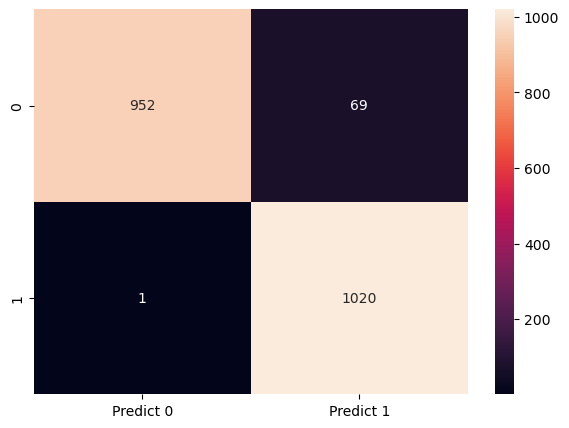

In [57]:
cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

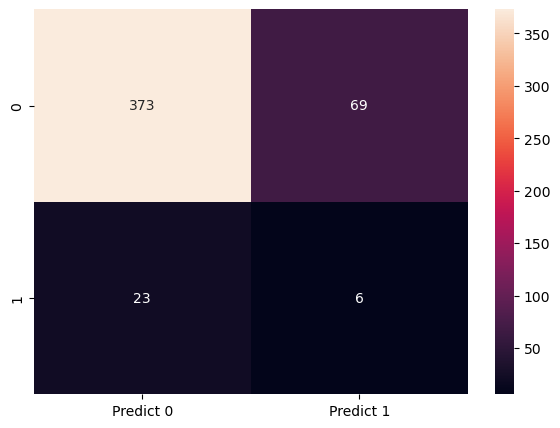

In [58]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [59]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96      1021
           1       0.94      1.00      0.97      1021

    accuracy                           0.97      2042
   macro avg       0.97      0.97      0.97      2042
weighted avg       0.97      0.97      0.97      2042



**Classification Report for Testing data**

In [60]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89       442
           1       0.08      0.21      0.12        29

    accuracy                           0.80       471
   macro avg       0.51      0.53      0.50       471
weighted avg       0.89      0.80      0.84       471



**Accuracy**

In [61]:
logis_model_score_test=logis_model.score(X_test_scaled,y_test)
logis_model_score_train=logis_model.score(X_sm_train_scaled,y_sm_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(logis_model_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(logis_model_score_test))

Accuracy of the model on train data is: 0.97
Accuracy of the model on test data is: 0.80


**Precision**

In [62]:
logis_model_Prec_test = metrics.precision_score(y_test,y_predict_test)
logis_model_Prec_train = metrics.precision_score(y_sm_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(logis_model_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(logis_model_Prec_test))

The precision of the model on train data is : 0.94
The precision of the model on test data is : 0.08


**Recall**

In [63]:
logis_model_Recall_train = metrics.recall_score(y_sm_train,y_predict_train)
logis_model_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(logis_model_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(logis_model_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.21


**F1-Score**

In [64]:
logis_model_f1score_train = metrics.f1_score(y_sm_train,y_predict_train)
logis_model_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(logis_model_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(logis_model_f1score_test))

The f1-score of the model on train data is : 0.97
The f1-score of the model on test data is : 0.12


**Based on the Classification Report we can observe the following**
- The model has performed well on the training data
- The model has performed not so well on the test data
- Recall, F1-Score and Precision of the model on Test data is very poor
- Based on the Train and Test accuracy we can say the model is an overfit model

**We'll apply cross validation on the X & y dataframe and also on the scaled Training dataset**

**Cross Validation on the X and y DFs which are not balanced or scaled)**

In [65]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
#from sklearn.metrics import make_scorer, precision_score, recall_score, f1_score

num_folds = 15
seed = 7

kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)
model = LogisticRegression()

results = cross_val_score(model, X,y, cv=kfold)
print(results)

print("Accuracy: %.3f%% and Std: (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.96190476 0.95238095 0.96190476 0.94285714 0.92380952 0.92380952
 0.91428571 0.96153846 0.93269231 0.90384615 0.86538462 0.94230769
 0.95192308 0.86538462 1.        ]
Accuracy: 93.360% and Std: (3.502%)


**Cross Validation on the balanced and scaled dataframes**

In [66]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

num_folds = 15
seed = 7

kfold = KFold(n_splits=num_folds, random_state=seed, shuffle=True)

results = cross_val_score(model, X_sm_train_scaled,y_sm_train, cv=kfold)
print(results)
print("Accuracy: %.3f%% and Std: (%.3f%%)" % (results.mean()*100.0, results.std()*100.0))

[0.91970803 0.91970803 0.90441176 0.92647059 0.93382353 0.95588235
 0.94117647 0.94117647 0.91911765 0.91176471 0.94117647 0.94117647
 0.92647059 0.95588235 0.94117647]
Accuracy: 93.194% and Std: (1.475%)


**With Cross-Validation we observe the following:**
- On the Original X and y dataset, the model has an accuracy of 93.36% with a standard deviation of 3.5%
- On the balanced and scaled training set X_sm_train_scaled and y_sm_train dataset, the model has an accuracy of 93.19% with a standard deviation of 1.4%
- So we can conclude that with Cross-Validation we can achieve a generalised model which is not over or underfit

**We'll use RandomizedSearchCV to tune the hyperparameters of the Logistic Regression model**

In [67]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=10)

penalty=['l1', 'l2', 'elasticnet']
dual=[False,True]
tol=uniform(0.0001,0.001)
C=uniform(0,10)
fit_intercept=[True,False]
intercept_scaling=uniform(0,10)
random_state=10
solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
class_weight=['balanced', 'None']
multi_class = ['auto', 'ovr', 'multinomial']
warm_start = [True, False]

hyperparameters = dict(penalty=penalty, 
                       dual=dual, 
                       tol=tol, 
                       C=C, 
                       fit_intercept=fit_intercept, 
                       intercept_scaling=intercept_scaling,
                       #random_state=random_state,
                       solver=solver,
                       class_weight=class_weight,
                       multi_class=multi_class,
                       warm_start=warm_start
                      )

lr=LogisticRegression()
rand = RandomizedSearchCV(lr, hyperparameters, cv=skf, verbose = 3, n_iter=100, n_jobs=-1)
#Fitting the model
rand.fit(X_sm_train_scaled, y_sm_train)
rand.best_score_

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F24C6F20>,
                                        'class_weight': ['balanced', 'None'],
                                        'dual': [False, True],
                                        'fit_intercept': [True, False],
                                        'intercept_scaling': <sc...s._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F5EDF880>,
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['lbfgs', 'liblinear',
                                                   'newton-cg',
                                                   'newton-cholesky', 'sag',
                                                   'saga'],
                                        'tol': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F24C5870>,
                                        'warm_start': [True, False]},
                   verbose=3)

0.9480798660927785

In [68]:
rand.best_estimator_.get_params()

{'C': 8.231115541548062,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': False,
 'intercept_scaling': 9.658447331276289,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0004095121875456852,
 'verbose': 0,
 'warm_start': True}

In [69]:
y_predict_test=rand.predict(X_test_scaled)
y_predict_train=rand.predict(X_sm_train_scaled)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

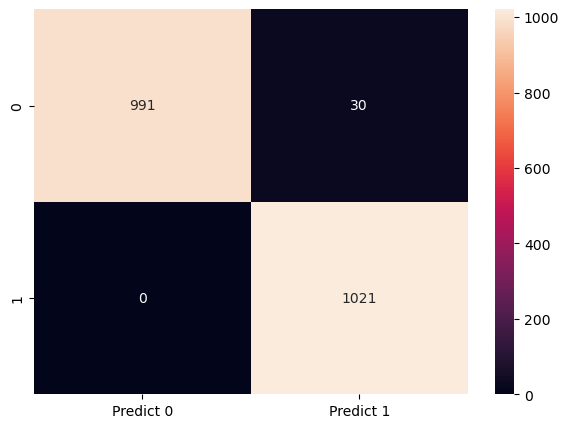

In [70]:
cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

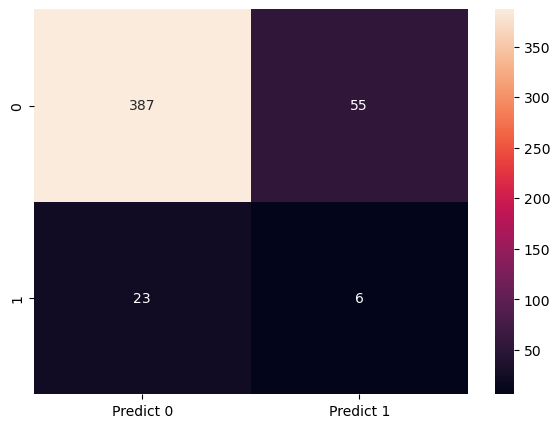

In [71]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [72]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      0.97      0.99      1021
           1       0.97      1.00      0.99      1021

    accuracy                           0.99      2042
   macro avg       0.99      0.99      0.99      2042
weighted avg       0.99      0.99      0.99      2042



**Classification Report for Testing data**

In [73]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       442
           1       0.10      0.21      0.13        29

    accuracy                           0.83       471
   macro avg       0.52      0.54      0.52       471
weighted avg       0.89      0.83      0.86       471



**Accuracy**

In [74]:
rand_score_test=rand.score(X_test_scaled,y_test)
rand_score_train=rand.score(X_sm_train_scaled,y_sm_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(rand_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(rand_score_test))

Accuracy of the model on train data is: 0.99
Accuracy of the model on test data is: 0.83


**Precision**

In [75]:
rand_Prec_test = metrics.precision_score(y_test,y_predict_test)
rand_Prec_train = metrics.precision_score(y_sm_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(rand_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(rand_Prec_test))

The precision of the model on train data is : 0.97
The precision of the model on test data is : 0.10


**Recall**

In [76]:
rand_Recall_train = metrics.recall_score(y_sm_train,y_predict_train)
rand_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(rand_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(rand_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.21


**F1-Score**

In [77]:
rand_f1score_train = metrics.f1_score(y_sm_train,y_predict_train)
rand_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(rand_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(rand_f1score_test))

The f1-score of the model on train data is : 0.99
The f1-score of the model on test data is : 0.13


**Observations**:
- The model has performed well on the train data
- The model has not performed equally well on the test data
- This maybe due to the distribution or statistical parameters differing between the train and test data
- The model can identify Pass condition with relatively high accuracy
- But Recall of the model is not good and hence for fail condition the model's prediction is not very good

**We'll apply PCA to reduce the dimensionality of the data**

In [78]:
from sklearn.decomposition import PCA
pca = PCA(n_components=X_sm_train_scaled.shape[1],random_state=1).fit(X_sm_train_scaled)
a = np.cumsum(pca.explained_variance_ratio_)
i = 0
while a[i] < 0.95:
    i = i+1
print('Number of dimensions needed to capture 95%% of variance:',i)


Number of dimensions needed to capture 95%% of variance: 159


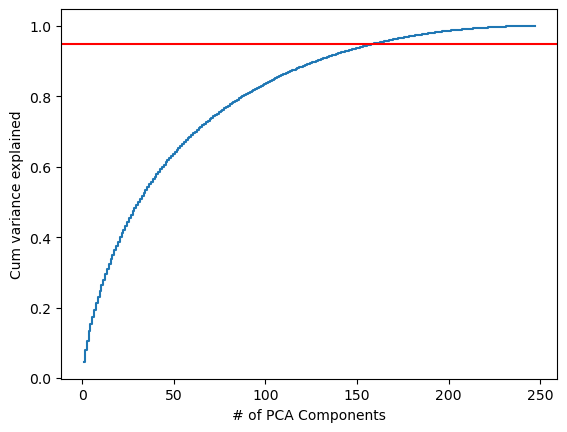

In [79]:
_=plt.step(list(range(1,248)),np.cumsum(pca.explained_variance_ratio_), where='mid')
_=plt.ylabel('Cum variance explained')
_=plt.xlabel('# of PCA Components')
_=plt.axhline(0.95, color='red')
plt.show()

- **We'll need to select atleast 159 components to account for 95% of variance in the data**
- **We'll tune the data to accomodate 159 components using PCA and then use the updated data to train the model**

In [80]:
pca159 = PCA(n_components=159,random_state=1).fit(X_sm_train_scaled)

**Transforming the train and test data**

In [81]:
X_sm_train_scaled_pca = pca159.transform(X_sm_train_scaled)
X_test_scaled_pca = pca159.transform(X_test_scaled)

**Training the model on PCA transformed data**

In [82]:
logis_model=LogisticRegression()
logis_model.fit(X_sm_train_scaled_pca,y_sm_train)
logis_model.score(X_test_scaled_pca, y_test)

LogisticRegression()

0.8195329087048833

In [83]:
y_predict_test=logis_model.predict(X_test_scaled_pca)
y_predict_train=logis_model.predict(X_sm_train_scaled_pca)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

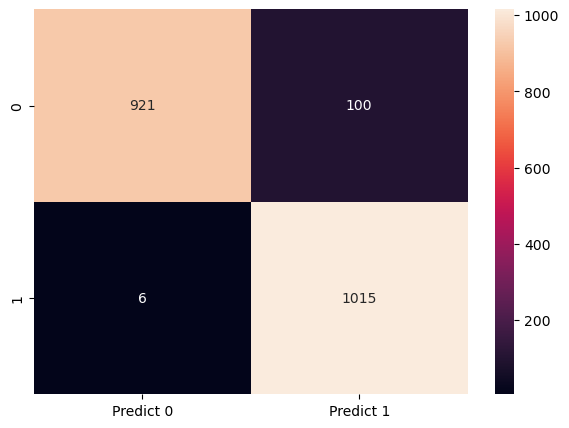

In [84]:
cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

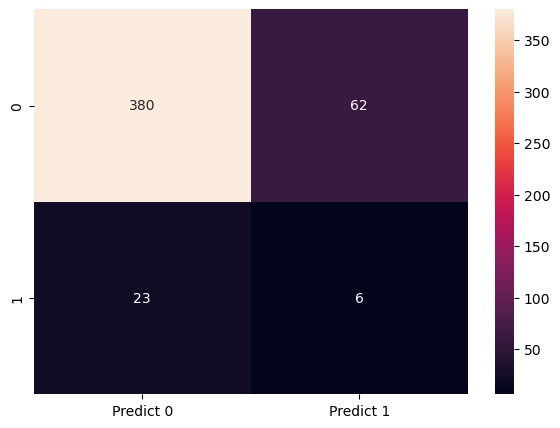

In [85]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [86]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       0.99      0.90      0.95      1021
           1       0.91      0.99      0.95      1021

    accuracy                           0.95      2042
   macro avg       0.95      0.95      0.95      2042
weighted avg       0.95      0.95      0.95      2042



**Classification Report for Testing data**

In [87]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.94      0.86      0.90       442
           1       0.09      0.21      0.12        29

    accuracy                           0.82       471
   macro avg       0.52      0.53      0.51       471
weighted avg       0.89      0.82      0.85       471



**Accuracy**

In [88]:
logis_model_score_test=logis_model.score(X_test_scaled_pca,y_test)
logis_model_score_train=logis_model.score(X_sm_train_scaled_pca,y_sm_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(logis_model_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(logis_model_score_test))

Accuracy of the model on train data is: 0.95
Accuracy of the model on test data is: 0.82


**Precision**

In [89]:
logis_model_Prec_test = metrics.precision_score(y_test,y_predict_test)
logis_model_Prec_train = metrics.precision_score(y_sm_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(logis_model_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(logis_model_Prec_test))

The precision of the model on train data is : 0.91
The precision of the model on test data is : 0.09


**Recall**

In [90]:
logis_model_Recall_train = metrics.recall_score(y_sm_train,y_predict_train)
logis_model_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(logis_model_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(logis_model_Recall_test))

The Sensitivity of the model on train data is : 0.99
The Sensitivity of the model on test data is : 0.21


**F1-Score**

In [91]:
logis_model_f1score_train = metrics.f1_score(y_sm_train,y_predict_train)
logis_model_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(logis_model_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(logis_model_f1score_test))

The f1-score of the model on train data is : 0.95
The f1-score of the model on test data is : 0.12


**Observations:**
- When compared to Logistic Regression Model (without hyperparameter tuning and without PCA transformation), the following can be observed for the Logistic Regression model trained on the scaled and PCA data (without hyperparameter tuning)
    - Training accuracy has decreased slightly 97% to 95% when compared to the earlier default LR model
    - Testing accuracy has slightly improved from 80% to 82%
    - The model is good at predicting Pass condition, but not so good at predicting fail condition

**We'll use RandomizedSearchCV to tune the hyperparameters of the model**

In [92]:
skf = StratifiedKFold(n_splits=10)

penalty=['l1', 'l2', 'elasticnet']
dual=[False,True]
tol=np.random.uniform(0.0001,0.001,100)
C=np.random.uniform(0,100,100)
fit_intercept=[True,False]
intercept_scaling=np.random.uniform(0,100,100)
random_state=10
solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
class_weight=['balanced', 'None']
multi_class = ['auto', 'ovr', 'multinomial']
warm_start = [True, False]

hyperparameters = dict(penalty=penalty, 
                       dual=dual, 
                       tol=tol, 
                       C=C, 
                       fit_intercept=fit_intercept, 
                       intercept_scaling=intercept_scaling,
                       #random_state=random_state,
                       solver=solver,
                       class_weight=class_weight,
                       multi_class=multi_class,
                       warm_start=warm_start
                      )

lr=LogisticRegression()
rand = RandomizedSearchCV(lr, hyperparameters, cv=skf, verbose = 3, n_iter=1000, n_jobs=-1)
#Fitting the model
rand.fit(X_sm_train_scaled_pca, y_sm_train)
rand.best_score_

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_iter=1000, n_jobs=-1,
                   param_distributions={'C': array([34.27479458, 62.53694649, 16.60098859,  7.16493717, 50.3714573 ,
       74.03388005,  2.41273728,  2.42792048, 60.53995643, 89.56101556,
       48.63642176, 44.66518048, 57.80399253, 62.38881102, 24.31589252,
       40.111...
       0.00094643, 0.00088581, 0.00059859, 0.00077218, 0.00025226,
       0.00061483, 0.00064017, 0.00029715, 0.0001325 , 0.00071198,
       0.00056227, 0.00062048, 0.00032698, 0.0001208 , 0.00027752,
       0.00023096, 0.00028999, 0.000228  , 0.00058863, 0.00098352,
       0.00024461, 0.00095425, 0.00058751, 0.00094995, 0.00077906,
       0.00013488, 0.00048661, 0.00065124, 0.00019595, 0.0001186 ]),
                                        'warm_start': [True, False]},
                   verbose=3)

0.9417073170731707

In [93]:
rand.best_estimator_.get_params()

{'C': 81.20965013951434,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 27.489066443836673,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'ovr',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'newton-cg',
 'tol': 0.0005886285360999696,
 'verbose': 0,
 'warm_start': False}

In [94]:
y_predict_test=rand.predict(X_test_scaled_pca)
y_predict_train=rand.predict(X_sm_train_scaled_pca)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

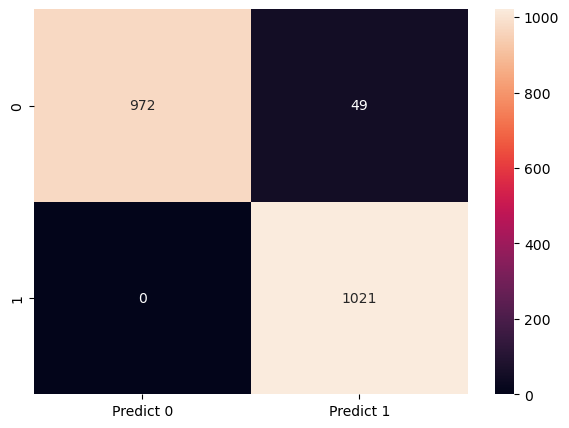

In [95]:
cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

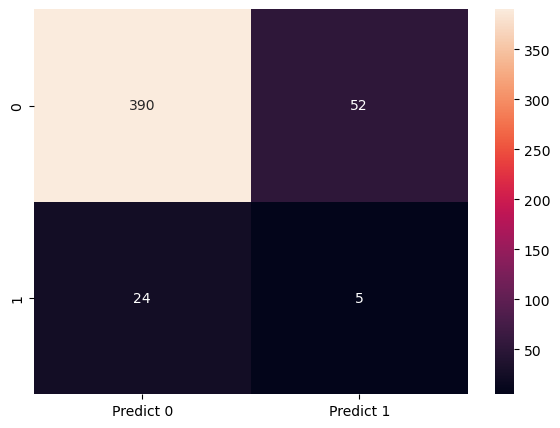

In [96]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [97]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      0.95      0.98      1021
           1       0.95      1.00      0.98      1021

    accuracy                           0.98      2042
   macro avg       0.98      0.98      0.98      2042
weighted avg       0.98      0.98      0.98      2042



**Classification Report for Testing data**

In [98]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       442
           1       0.09      0.17      0.12        29

    accuracy                           0.84       471
   macro avg       0.51      0.53      0.51       471
weighted avg       0.89      0.84      0.86       471



**Accuracy**

In [99]:
rand_score_test=rand.score(X_test_scaled_pca,y_test)
rand_score_train=rand.score(X_sm_train_scaled_pca,y_sm_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(rand_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(rand_score_test))

Accuracy of the model on train data is: 0.98
Accuracy of the model on test data is: 0.84


**Precision**

In [100]:
rand_Prec_test = metrics.precision_score(y_test,y_predict_test)
rand_Prec_train = metrics.precision_score(y_sm_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(rand_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(rand_Prec_test))

The precision of the model on train data is : 0.95
The precision of the model on test data is : 0.09


**Recall**

In [101]:
rand_Recall_train = metrics.recall_score(y_sm_train,y_predict_train)
rand_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(rand_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(rand_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.17


**F1-Score**

In [102]:
rand_f1score_train = metrics.f1_score(y_sm_train,y_predict_train)
rand_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(rand_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(rand_f1score_test))

The f1-score of the model on train data is : 0.98
The f1-score of the model on test data is : 0.12


**Observations**:
- When compared to Logistic Regression Model (after hyperparameter tuning) without PCA transformation, the following can be observed for the Logistic Regression model trained on the scaled and PCA data (after hyperparameter tuning) 
    - Performnce of the model has stayed relatively similar when compared to the earlier hyper-tuned LR model
    - The train data accuracy has changed slighltly from 99% to 98%
    - The Test data accuracy has changed slighltly from 83% to 84%
    - Similar to earlier models, the model is good at predicting Pass condition, but not so good at predicting a Fail condition

### Now we'll experiment by undersampling the original scaled dataframe using ClusterCentroids to see if the model performance can be improved

**Applying Cluster Centroids on Train data**

In [103]:
from imblearn.under_sampling import ClusterCentroids

cc=ClusterCentroids()
#sm=SMOTE(sampling_strategy = 'auto' ,k_neighbors = 20, random_state=10)

#from imblearn.combine import SMOTETomek
#sm=SMOTETomek()
X_cc_train,y_cc_train=cc.fit_resample(X_train,y_train) #Oversampling Training dataset using SMOTE

**After ClusterCentroids**

In [104]:
print('Number of entries in training data with result Pass (0) are: {0} which is {1:.2f}% of entries'.format(y_cc_train.value_counts()[0],y_cc_train.value_counts()[0]*100/len(y_cc_train)))
print('Number of entries in training data with result Fail (1) are: {0} which is {1:.2f}% of entries'.format(y_cc_train.value_counts()[1], y_cc_train.value_counts()[1]*100/len(y_cc_train)))

Number of entries in training data with result Pass (0) are: 75 which is 50.00% of entries
Number of entries in training data with result Fail (1) are: 75 which is 50.00% of entries


**Now we'll scale the data. This time with StandardScalar**

In [105]:
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler().fit(X_cc_train)
X_cc_train_scaled = scaler.transform(X_cc_train) 
X_test_scaled_ss = scaler.transform(X_test) 

**First we'll train a Logistic Regression Model with default parameters on the cluster centroids treated data**

In [106]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

logis_model=LogisticRegression()
logis_model.fit(X_cc_train_scaled,y_cc_train)
logis_model.score(X_test_scaled_ss, y_test)

LogisticRegression()

0.7346072186836518

In [107]:
y_predict_test=logis_model.predict(X_test_scaled_ss)
y_predict_train=logis_model.predict(X_cc_train_scaled)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

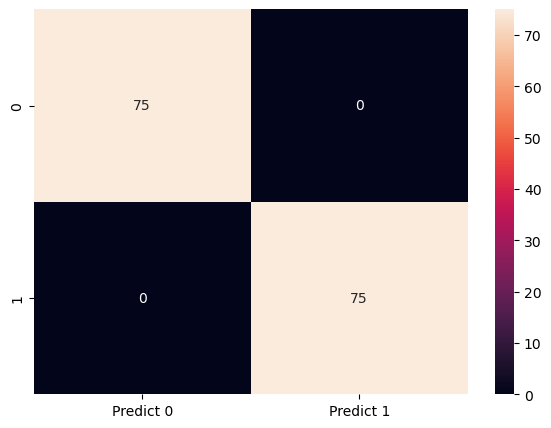

In [108]:
cm=metrics.confusion_matrix(y_cc_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

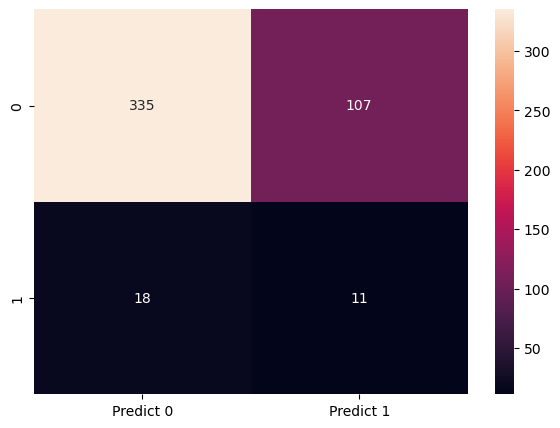

In [109]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [110]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_cc_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



**Classification Report for Testing data**

In [111]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.95      0.76      0.84       442
           1       0.09      0.38      0.15        29

    accuracy                           0.73       471
   macro avg       0.52      0.57      0.50       471
weighted avg       0.90      0.73      0.80       471



**Accuracy**

In [112]:
logis_model_score_test=logis_model.score(X_test_scaled_ss,y_test)
logis_model_score_train=logis_model.score(X_cc_train_scaled,y_cc_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(logis_model_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(logis_model_score_test))

Accuracy of the model on train data is: 1.00
Accuracy of the model on test data is: 0.73


**Precision**

In [113]:
logis_model_Prec_test = metrics.precision_score(y_test,y_predict_test)
logis_model_Prec_train = metrics.precision_score(y_cc_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(logis_model_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(logis_model_Prec_test))

The precision of the model on train data is : 1.00
The precision of the model on test data is : 0.09


**Recall**

In [114]:
logis_model_Recall_train = metrics.recall_score(y_cc_train,y_predict_train)
logis_model_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(logis_model_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(logis_model_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.38


**F1-Score**

In [115]:
logis_model_f1score_train = metrics.f1_score(y_cc_train,y_predict_train)
logis_model_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(logis_model_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(logis_model_f1score_test))

The f1-score of the model on train data is : 1.00
The f1-score of the model on test data is : 0.15


**Based on the Classification Report we can observe the following**
- The performance of Default Logistic Regression model has deteriorated when using Cluster Centroid undersampled data, when compared with the SMOTE oversample data
- The accuracy on test data has reduced from 80% to 73%
- Recall has improved from 21% to 38%

**We'll use RandomizedSearchCV to tune the hyperparameters of the Logistic Regression model using Cluster Centroids treated data**

In [116]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=10)

penalty=['l1', 'l2', 'elasticnet']
dual=[False,True]
tol=uniform(0.0001,0.001)
C=uniform(0,10)
fit_intercept=[True,False]
intercept_scaling=uniform(0,10)
random_state=10
solver=['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
class_weight=['balanced', 'None']
multi_class = ['auto', 'ovr', 'multinomial']
warm_start = [True, False]

hyperparameters = dict(penalty=penalty, 
                       dual=dual, 
                       tol=tol, 
                       C=C, 
                       fit_intercept=fit_intercept, 
                       intercept_scaling=intercept_scaling,
                       #random_state=random_state,
                       solver=solver,
                       class_weight=class_weight,
                       multi_class=multi_class,
                       warm_start=warm_start
                      )

lr=LogisticRegression()
rand = RandomizedSearchCV(lr, hyperparameters, cv=skf, verbose = 3, n_iter=100, n_jobs=-1)
#Fitting the model
rand.fit(X_cc_train_scaled, y_cc_train)
rand.best_score_

Fitting 10 folds for each of 100 candidates, totalling 1000 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_iter=100, n_jobs=-1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F42FD750>,
                                        'class_weight': ['balanced', 'None'],
                                        'dual': [False, True],
                                        'fit_intercept': [True, False],
                                        'intercept_scaling': <sc...s._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F42FCB50>,
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['lbfgs', 'liblinear',
                                                   'newton-cg',
                                                   'newton-cholesky', 'sag',
                                                   'saga'],
                                        'tol': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F42FDFC0>,
                                        'warm_start': [True, False]},
                   verbose=3)

0.78

In [117]:
rand.best_estimator_.get_params()

{'C': 3.4838290322270327,
 'class_weight': 'balanced',
 'dual': False,
 'fit_intercept': False,
 'intercept_scaling': 7.158522058857116,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'liblinear',
 'tol': 0.0005508092568306867,
 'verbose': 0,
 'warm_start': True}

In [118]:
y_predict_test=rand.predict(X_test_scaled_ss)
y_predict_train=rand.predict(X_cc_train_scaled)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

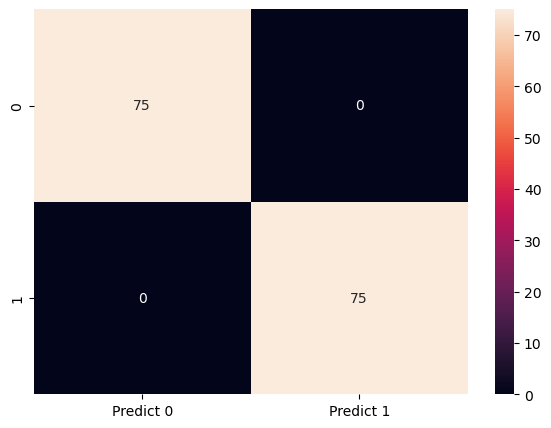

In [119]:
cm=metrics.confusion_matrix(y_cc_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

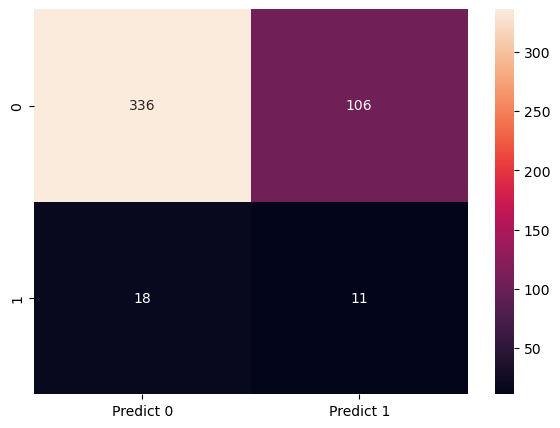

In [120]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [121]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_cc_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00        75
           1       1.00      1.00      1.00        75

    accuracy                           1.00       150
   macro avg       1.00      1.00      1.00       150
weighted avg       1.00      1.00      1.00       150



**Classification Report for Testing data**

In [122]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.95      0.76      0.84       442
           1       0.09      0.38      0.15        29

    accuracy                           0.74       471
   macro avg       0.52      0.57      0.50       471
weighted avg       0.90      0.74      0.80       471



**Accuracy**

In [123]:
rand_score_test=rand.score(X_test_scaled_ss,y_test)
rand_score_train=rand.score(X_cc_train_scaled,y_cc_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(rand_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(rand_score_test))

Accuracy of the model on train data is: 1.00
Accuracy of the model on test data is: 0.74


**Precision**

In [124]:
rand_Prec_test = metrics.precision_score(y_test,y_predict_test)
rand_Prec_train = metrics.precision_score(y_cc_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(rand_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(rand_Prec_test))

The precision of the model on train data is : 1.00
The precision of the model on test data is : 0.09


**Recall**

In [125]:
rand_Recall_train = metrics.recall_score(y_cc_train,y_predict_train)
rand_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(rand_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(rand_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.38


**F1-Score**

In [126]:
rand_f1score_train = metrics.f1_score(y_cc_train,y_predict_train)
rand_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(rand_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(rand_f1score_test))

The f1-score of the model on train data is : 1.00
The f1-score of the model on test data is : 0.15


**Observations**:
- The performance of Logistic Regression model has deteriorated while using the Clister Centroid data, when compared to the SMOTE oversampled data.
- Even with hyper parameter tuning we were not able to improve the performance of the model
- The model with Cluster Centroids data, like the SMOTE data has performed well on the train data
- The model did not performed well on the test data
- When compared to the hyper parameter tuned model using SMOTE data, the accuracy of the hyper parameter tuned model using Cluster Centroid data has gone down from 83% to 74%

**So we see the model is not performing with Cluster Centroid undersampled data. So we'll continue further analysis using the SMOTE over sampled data**

### We'll experiment with Pipeline to transform the data with PCA and the tune the Logistic Regression model hyperparameters on the SMOTE data

In [127]:
pipe_svc = Pipeline([('pca', PCA()), ('lr', LogisticRegression())]) 
skf = StratifiedKFold(n_splits=10)

param_grid = {'pca__n_components':[159],
              'lr__penalty':['l1', 'l2', 'elasticnet'],
                'lr__dual':[False,True],
                'lr__tol':uniform(0.0001,0.001),
                'lr__C':uniform(0,100),
                'lr__fit_intercept':[True,False],
                'lr__intercept_scaling':uniform(0,100),
                'lr__solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
                'lr__class_weight':['balanced', 'None'],
                'lr__multi_class' : ['auto', 'ovr', 'multinomial'],
                'lr__warm_start' : [True, False]             
             } 

grid = RandomizedSearchCV(pipe_svc , param_distributions = param_grid, cv=skf, verbose = 3, n_iter=1000, n_jobs=-1) 

grid.fit(X_sm_train_scaled, y_sm_train) 

print(" Best cross-validation accuracy: {:.2f}". format( grid.best_score_)) 
print(" Best parameters: ", grid.best_params_) 
print(" Test set accuracy: {:.2f}". format( grid.score( X_test_scaled, y_test)))

Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=Pipeline(steps=[('pca', PCA()),
                                             ('lr', LogisticRegression())]),
                   n_iter=1000, n_jobs=-1,
                   param_distributions={'lr__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A095EA6950>,
                                        'lr__class_weight': ['balanced',
                                                             'None'],
                                        'lr__dual': [False, True],...
                                        'lr__intercept_scaling': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F79C5F30>,
                                        'lr__multi_class': ['auto', 'ovr',
                                                            'multinomial'],
                                        'lr__penalty': ['l1', 'l2',
                                                        'elasticnet'],
                                        'lr__solver': ['lbfgs', 'liblinear',
                                                       'newton-cg',
                                                       'newton-cholesky', 'sag',
                                                       'saga'],
                                        'lr__tol': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A0F79C45B0>,
                                        'lr__warm_start': [True, False],
                                        'pca__n_components': [159]},
                   verbose=3)

 Best cross-validation accuracy: 0.94
 Best parameters:  {'lr__C': 95.27207484858255, 'lr__class_weight': 'balanced', 'lr__dual': False, 'lr__fit_intercept': True, 'lr__intercept_scaling': 54.60565522095453, 'lr__multi_class': 'multinomial', 'lr__penalty': 'l2', 'lr__solver': 'sag', 'lr__tol': 0.00029821317827698305, 'lr__warm_start': False, 'pca__n_components': 159}
 Test set accuracy: 0.84


In [128]:
y_predict_test=grid.predict(X_test_scaled)
y_predict_train=grid.predict(X_sm_train_scaled)

**Confusion Matrix for Training Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

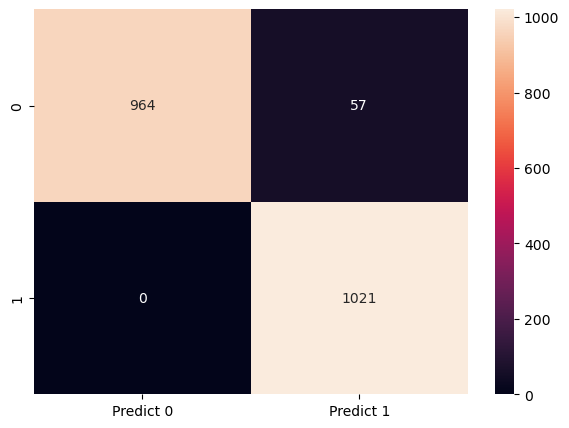

In [129]:
cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])

df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_train, annot=True,fmt='g')

**Confusion Matrix for Testing Data:**

<Figure size 700x500 with 0 Axes>

<Axes: >

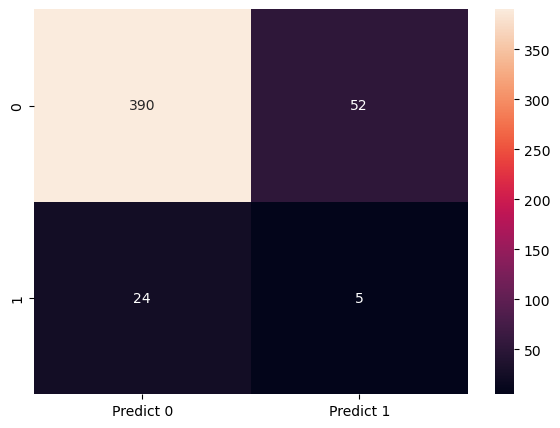

In [130]:
from sklearn import metrics
cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])

df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm_test, annot=True,fmt='g')

**Classification Report for Training data**

In [131]:
print("Classification  Report for the Model on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))

Classification  Report for the Model on Training data:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97      1021
           1       0.95      1.00      0.97      1021

    accuracy                           0.97      2042
   macro avg       0.97      0.97      0.97      2042
weighted avg       0.97      0.97      0.97      2042



**Classification Report for Testing data**

In [132]:
print("Classification  Report for the Model:\n",metrics.classification_report(y_test,y_predict_test))

Classification  Report for the Model:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       442
           1       0.09      0.17      0.12        29

    accuracy                           0.84       471
   macro avg       0.51      0.53      0.51       471
weighted avg       0.89      0.84      0.86       471



**Accuracy**

In [133]:
grid_score_test=grid.score(X_test_scaled,y_test)
grid_score_train=grid.score(X_sm_train_scaled,y_sm_train)
print('Accuracy of the model on train data is: {0:0.2f}'.format(grid_score_train))
print('Accuracy of the model on test data is: {0:0.2f}'.format(grid_score_test))

Accuracy of the model on train data is: 0.97
Accuracy of the model on test data is: 0.84


**Precision**

In [134]:
grid_Prec_test = metrics.precision_score(y_test,y_predict_test)
grid_Prec_train = metrics.precision_score(y_sm_train,y_predict_train)
print('The precision of the model on train data is : {0:0.2f}'.format(grid_Prec_train))
print('The precision of the model on test data is : {0:0.2f}'.format(grid_Prec_test))

The precision of the model on train data is : 0.95
The precision of the model on test data is : 0.09


**Recall**

In [135]:
grid_Recall_train = metrics.recall_score(y_sm_train,y_predict_train)
grid_Recall_test = metrics.recall_score(y_test,y_predict_test)
print('The Sensitivity of the model on train data is : {0:0.2f}'.format(grid_Recall_train))
print('The Sensitivity of the model on test data is : {0:0.2f}'.format(grid_Recall_test))

The Sensitivity of the model on train data is : 1.00
The Sensitivity of the model on test data is : 0.17


**F1-Score**

In [136]:
grid_f1score_train = metrics.f1_score(y_sm_train,y_predict_train)
grid_f1score_test = metrics.f1_score(y_test,y_predict_test)
print('The f1-score of the model on train data is : {0:0.2f}'.format(grid_f1score_train))
print('The f1-score of the model on test data is : {0:0.2f}'.format(grid_f1score_test))

The f1-score of the model on train data is : 0.97
The f1-score of the model on test data is : 0.12


### Explanation of the Classification Report of model developed using the Pipeline:
- Based on the classification Report we can see that the model tuned using Pipeline has similar performance to the previous models
    - The model has 97% accuracy for the Train data
    - The model has 84% accuracy for Test data
    - The model has a Precision of 94% on Test data for Pass class
    - The model has a Precision of 09% on Test data for Fail class
    - The model has a Recall of 88% on Test data for Pass class
    - The model has a Recall of 17% on Test data for Fail class
    - The model has a F1-Score of 91% on Test data for Pass class
    - The model has a F1-Score of 12% on Test data for Fail class
    - Support of the train data is specifying that there are 1021 datapoints with Result 'Pass' and another 1021 with Result 'Fail'
    - Support of the test data is specifying that there are 442 datapoints with Result 'Pass' and 29 with Result 'Fail'

**Step1: We'll build the models using the scaled data (without PCA values)**

In [137]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier

models = [['NaiveBayes', GaussianNB()],
               ['KNeighbours', KNeighborsClassifier()],
               ['SVM', SVC()],
               ['DecisionTree',DecisionTreeClassifier()],
               ['Bagging',BaggingClassifier()],
               ['Adaboost',AdaBoostClassifier()],
               ['Gradientboost',GradientBoostingClassifier()],
               ['RandomForest',RandomForestClassifier()],
               ['LogisticRegression',LogisticRegression()]]

#######################################################################################

 Model NaiveBayes :
Confusion Matrix on Train data for  NaiveBayes


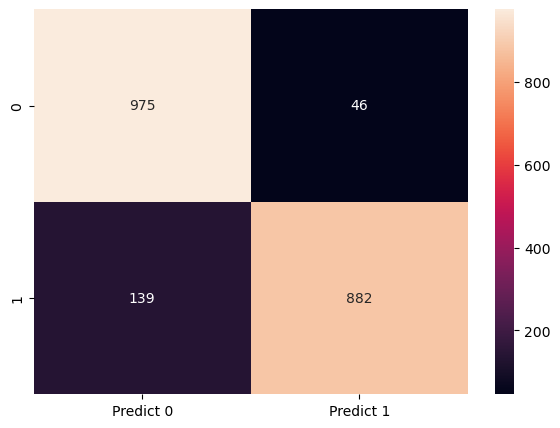

Confusion Matrix on Test data for  NaiveBayes


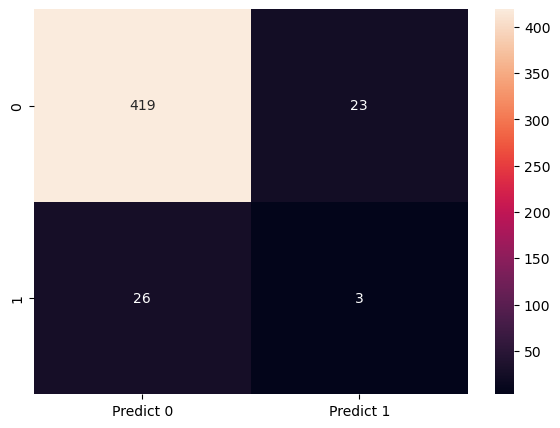

Classification  Report for the NaiveBayes on Training data:
               precision    recall  f1-score   support

           0       0.88      0.95      0.91      1021
           1       0.95      0.86      0.91      1021

    accuracy                           0.91      2042
   macro avg       0.91      0.91      0.91      2042
weighted avg       0.91      0.91      0.91      2042

Classification  Report for the NaiveBayes on Test data:
               precision    recall  f1-score   support

           0       0.94      0.95      0.94       442
           1       0.12      0.10      0.11        29

    accuracy                           0.90       471
   macro avg       0.53      0.53      0.53       471
weighted avg       0.89      0.90      0.89       471

#######################################################################################

#######################################################################################

 Model KNeighbours :
Confusion Matrix on Train dat

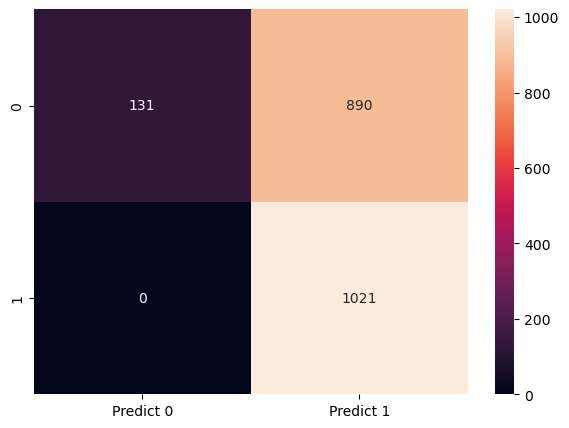

Confusion Matrix on Test data for  KNeighbours


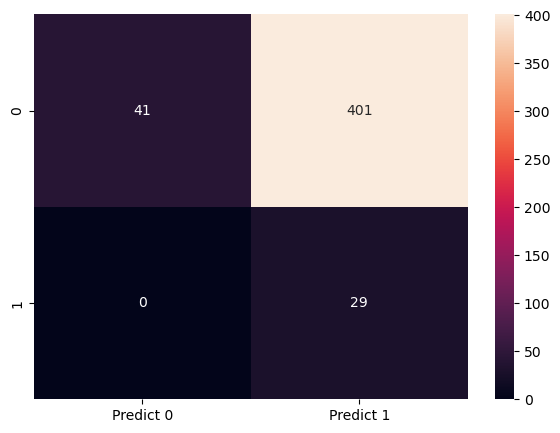

Classification  Report for the KNeighbours on Training data:
               precision    recall  f1-score   support

           0       1.00      0.13      0.23      1021
           1       0.53      1.00      0.70      1021

    accuracy                           0.56      2042
   macro avg       0.77      0.56      0.46      2042
weighted avg       0.77      0.56      0.46      2042

Classification  Report for the KNeighbours on Test data:
               precision    recall  f1-score   support

           0       1.00      0.09      0.17       442
           1       0.07      1.00      0.13        29

    accuracy                           0.15       471
   macro avg       0.53      0.55      0.15       471
weighted avg       0.94      0.15      0.17       471

#######################################################################################

#######################################################################################

 Model SVM :
Confusion Matrix on Train data for 

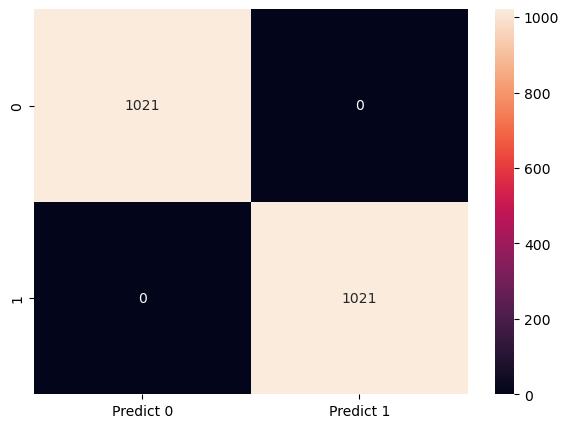

Confusion Matrix on Test data for  SVM


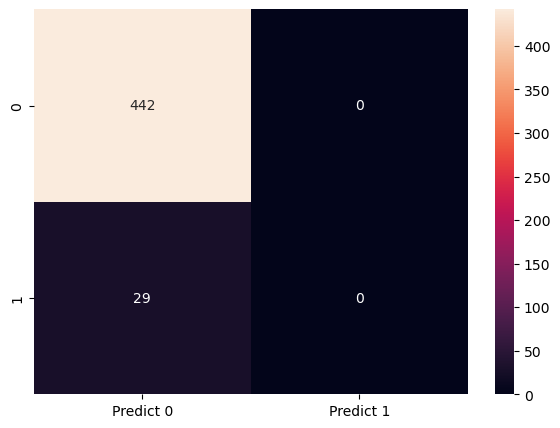

Classification  Report for the SVM on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the SVM on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model DecisionTree :
Confusion Matrix on Train data for  Decisi

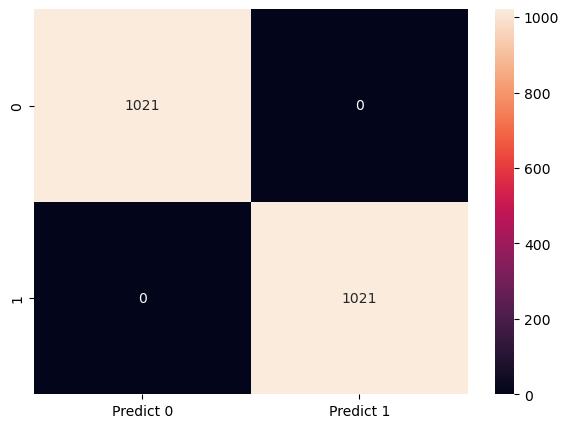

Confusion Matrix on Test data for  DecisionTree


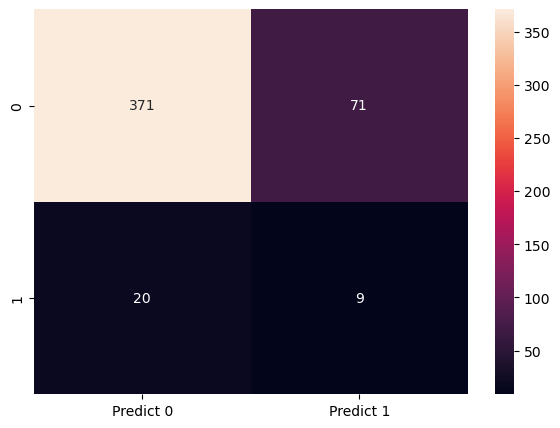

Classification  Report for the DecisionTree on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the DecisionTree on Test data:
               precision    recall  f1-score   support

           0       0.95      0.84      0.89       442
           1       0.11      0.31      0.17        29

    accuracy                           0.81       471
   macro avg       0.53      0.57      0.53       471
weighted avg       0.90      0.81      0.85       471

#######################################################################################

#######################################################################################

 Model Bagging :
Confusion Matrix on Train dat

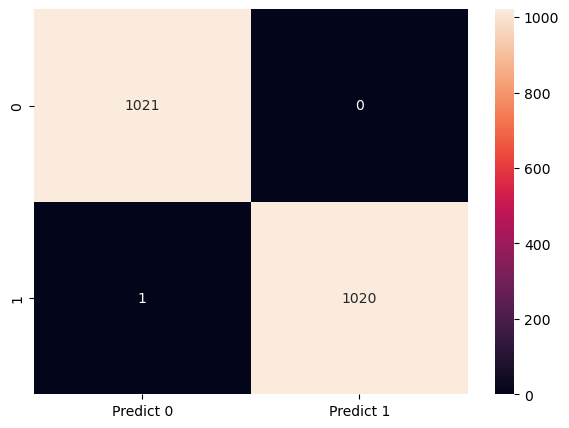

Confusion Matrix on Test data for  Bagging


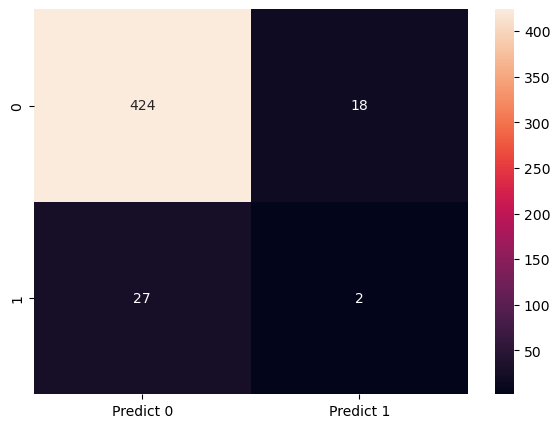

Classification  Report for the Bagging on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Bagging on Test data:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95       442
           1       0.10      0.07      0.08        29

    accuracy                           0.90       471
   macro avg       0.52      0.51      0.52       471
weighted avg       0.89      0.90      0.90       471

#######################################################################################

#######################################################################################

 Model Adaboost :
Confusion Matrix on Train data for  Ad

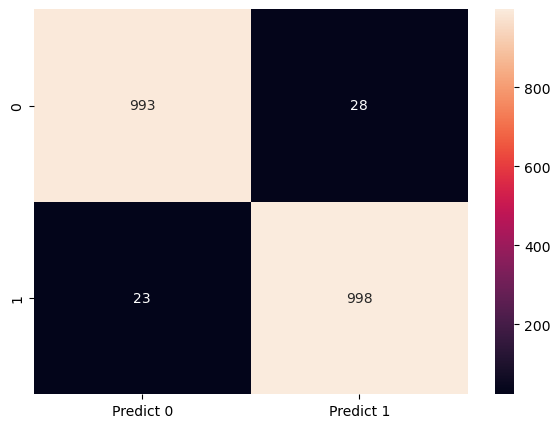

Confusion Matrix on Test data for  Adaboost


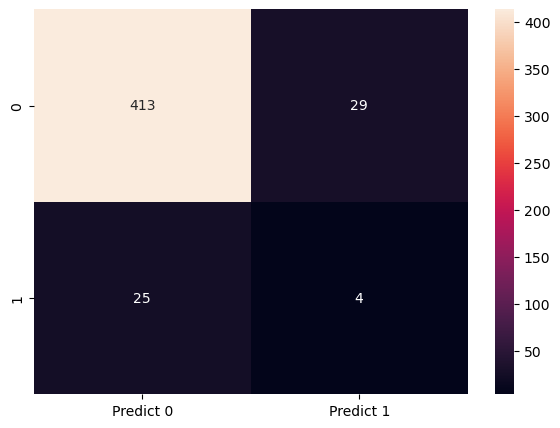

Classification  Report for the Adaboost on Training data:
               precision    recall  f1-score   support

           0       0.98      0.97      0.97      1021
           1       0.97      0.98      0.98      1021

    accuracy                           0.98      2042
   macro avg       0.98      0.98      0.98      2042
weighted avg       0.98      0.98      0.98      2042

Classification  Report for the Adaboost on Test data:
               precision    recall  f1-score   support

           0       0.94      0.93      0.94       442
           1       0.12      0.14      0.13        29

    accuracy                           0.89       471
   macro avg       0.53      0.54      0.53       471
weighted avg       0.89      0.89      0.89       471

#######################################################################################

#######################################################################################

 Model Gradientboost :
Confusion Matrix on Train data 

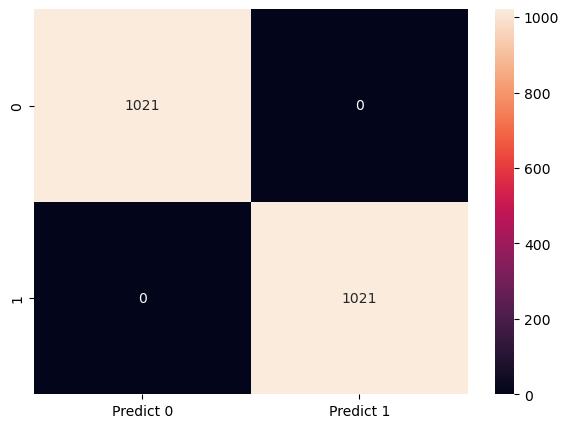

Confusion Matrix on Test data for  Gradientboost


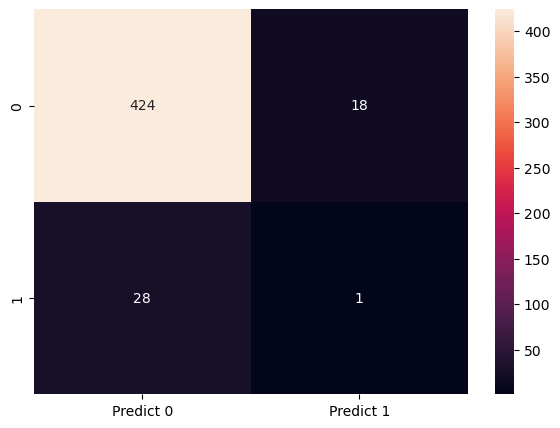

Classification  Report for the Gradientboost on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Gradientboost on Test data:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95       442
           1       0.05      0.03      0.04        29

    accuracy                           0.90       471
   macro avg       0.50      0.50      0.50       471
weighted avg       0.88      0.90      0.89       471

#######################################################################################

#######################################################################################

 Model RandomForest :
Confusion Matrix on Tr

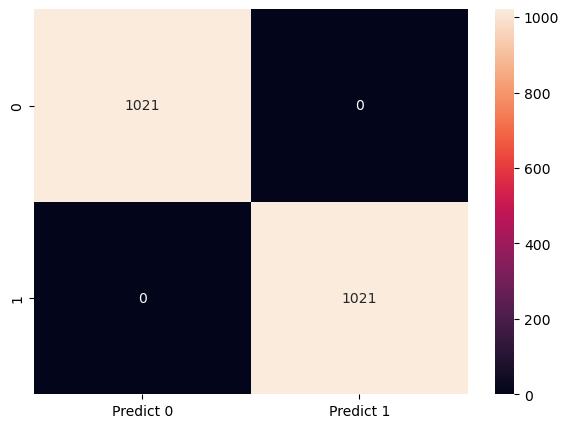

Confusion Matrix on Test data for  RandomForest


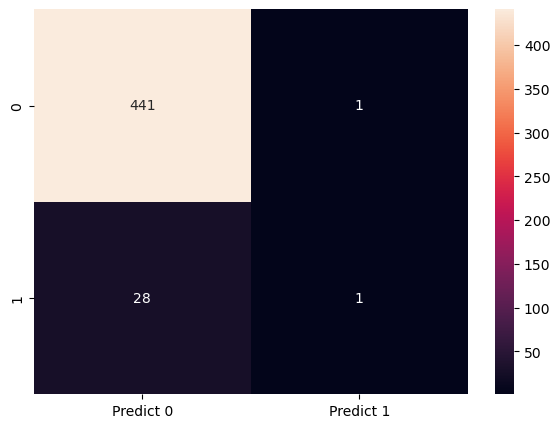

Classification  Report for the RandomForest on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the RandomForest on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.50      0.03      0.06        29

    accuracy                           0.94       471
   macro avg       0.72      0.52      0.52       471
weighted avg       0.91      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model LogisticRegression :
Confusion Matrix o

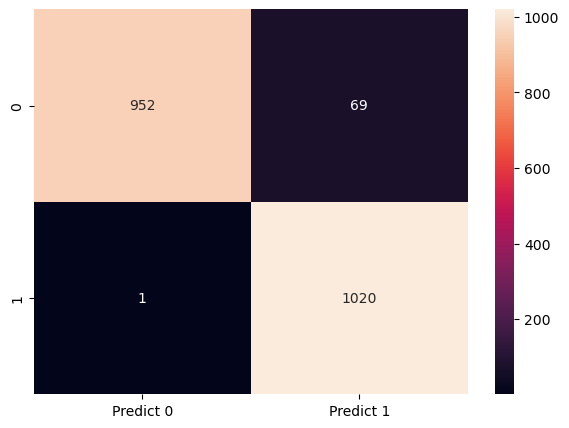

Confusion Matrix on Test data for  LogisticRegression


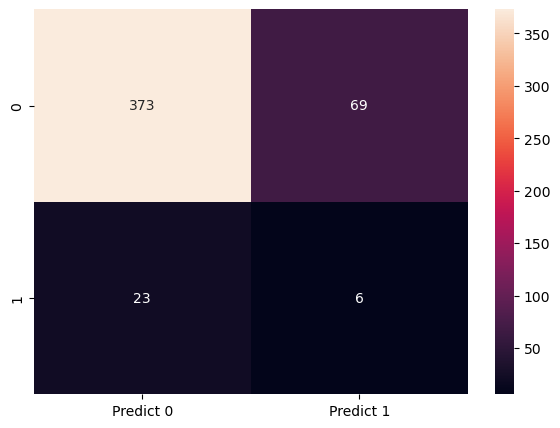

Classification  Report for the LogisticRegression on Training data:
               precision    recall  f1-score   support

           0       1.00      0.93      0.96      1021
           1       0.94      1.00      0.97      1021

    accuracy                           0.97      2042
   macro avg       0.97      0.97      0.97      2042
weighted avg       0.97      0.97      0.97      2042

Classification  Report for the LogisticRegression on Test data:
               precision    recall  f1-score   support

           0       0.94      0.84      0.89       442
           1       0.08      0.21      0.12        29

    accuracy                           0.80       471
   macro avg       0.51      0.53      0.50       471
weighted avg       0.89      0.80      0.84       471

#######################################################################################



In [138]:
train_accuracy_list=[]
train_precision_list=[]
train_recall_list=[]
train_f1score_list=[]
test_accuracy_list=[]
test_precision_list=[]
test_recall_list=[]
test_f1score_list=[]
ml=[]
scdata_model_list=[]

for model_name, model in models:
    #Model fitting
    clf = model.fit(X_sm_train_scaled, y_sm_train)
    #Predicting
    y_predict_test=model.predict(X_test_scaled)
    y_predict_train=model.predict(X_sm_train_scaled)
    #Train confusion matrix
    print('#######################################################################################\n')
    print('\033[1m Model',model_name,':\033[0m')
    print('Confusion Matrix on Train data for ',model_name)
    cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])
    df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_train, annot=True,fmt='g')
    _=plt.show()
    #Test Confusion Matrix
    print('Confusion Matrix on Test data for ',model_name)
    cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])
    df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_test, annot=True,fmt='g')
    _=plt.show()
    print("Classification  Report for the", model_name, "on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))
    print("Classification  Report for the", model_name, "on Test data:\n",metrics.classification_report(y_test,y_predict_test))
    test_accuracy_list.append(clf.score(X_test_scaled,y_test))
    train_accuracy_list.append(clf.score(X_sm_train_scaled,y_sm_train))
    train_precision_list.append(metrics.precision_score(y_sm_train,y_predict_train))
    test_precision_list.append(metrics.precision_score(y_test,y_predict_test))
    train_recall_list.append(metrics.recall_score(y_sm_train,y_predict_train))
    test_recall_list.append(metrics.recall_score(y_test,y_predict_test))
    train_f1score_list.append(metrics.f1_score(y_sm_train,y_predict_train))
    test_f1score_list.append(metrics.f1_score(y_test,y_predict_test))
    ml.append(model_name)
    scdata_model_list.append(clf)
    print('#######################################################################################\n')
    

In [139]:
models_perf1 = pd.DataFrame({
    'Model Name':ml,
    'Train Accuracy': train_accuracy_list,
    'Test Accuracy': test_accuracy_list,
    'Train Precision': train_precision_list,
    'Test Precision': test_precision_list,
    'Train Recall': train_recall_list,
    'Test Recall': test_recall_list,
    'Train F1-Score': train_f1score_list,
    'Test F1-Score': test_f1score_list
})
print('Performance of Models with scaled values, but not PCA treated:\n')
models_perf1

Performance of Models with scaled values, but not PCA treated:



,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.91,0.90,0.95,0.12,0.86,0.10,0.91,0.11
1,KNeighbours,0.56,0.15,0.53,0.07,1.00,1.00,0.70,0.13
2,SVM,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,1.00,0.81,1.00,0.11,1.00,0.31,1.00,0.17
4,Bagging,1.00,0.90,1.00,0.10,1.00,0.07,1.00,0.08
5,Adaboost,0.98,0.89,0.97,0.12,0.98,0.14,0.98,0.13
6,Gradientboost,1.00,0.90,1.00,0.05,1.00,0.03,1.00,0.04
7,RandomForest,1.00,0.94,1.00,0.50,1.00,0.03,1.00,0.06
8,LogisticRegression,0.97,0.80,0.94,0.08,1.00,0.21,0.97,0.12


**Step 2: Now we'll build the models using the PCA applied features**

#######################################################################################

 Model NaiveBayes :
Confusion Matrix on Train data for  NaiveBayes


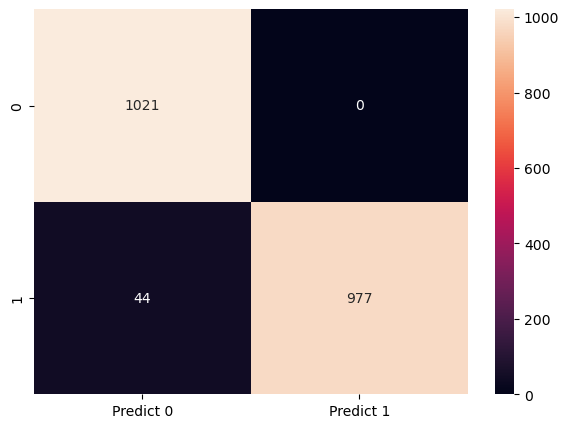

Confusion Matrix on Test data for  NaiveBayes


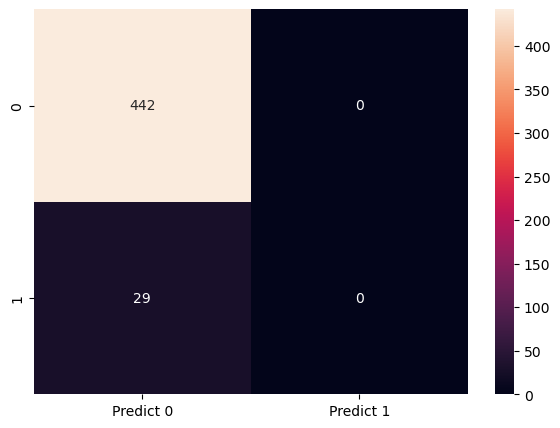

Classification  Report for the NaiveBayes on Training data:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98      1021
           1       1.00      0.96      0.98      1021

    accuracy                           0.98      2042
   macro avg       0.98      0.98      0.98      2042
weighted avg       0.98      0.98      0.98      2042

Classification  Report for the NaiveBayes on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model KNeighbours :
Confusion Matrix on Train dat

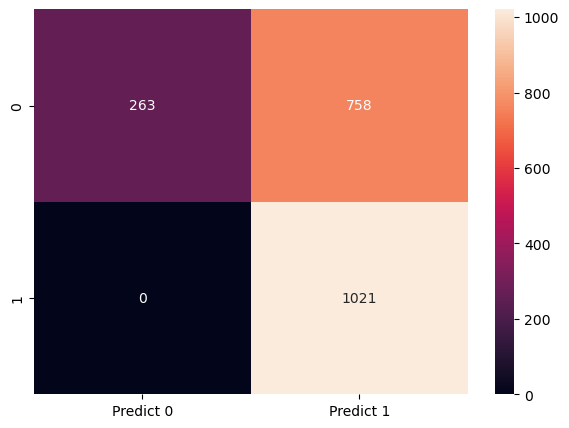

Confusion Matrix on Test data for  KNeighbours


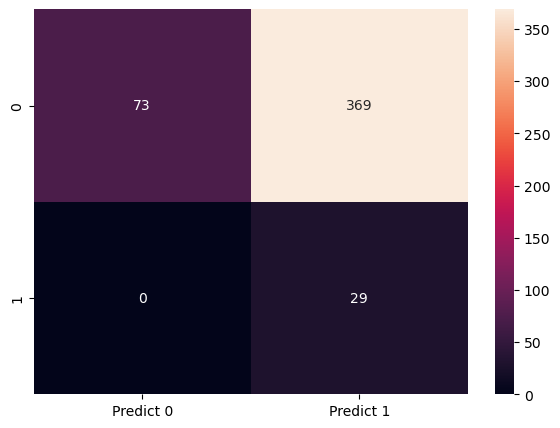

Classification  Report for the KNeighbours on Training data:
               precision    recall  f1-score   support

           0       1.00      0.26      0.41      1021
           1       0.57      1.00      0.73      1021

    accuracy                           0.63      2042
   macro avg       0.79      0.63      0.57      2042
weighted avg       0.79      0.63      0.57      2042

Classification  Report for the KNeighbours on Test data:
               precision    recall  f1-score   support

           0       1.00      0.17      0.28       442
           1       0.07      1.00      0.14        29

    accuracy                           0.22       471
   macro avg       0.54      0.58      0.21       471
weighted avg       0.94      0.22      0.27       471

#######################################################################################

#######################################################################################

 Model SVM :
Confusion Matrix on Train data for 

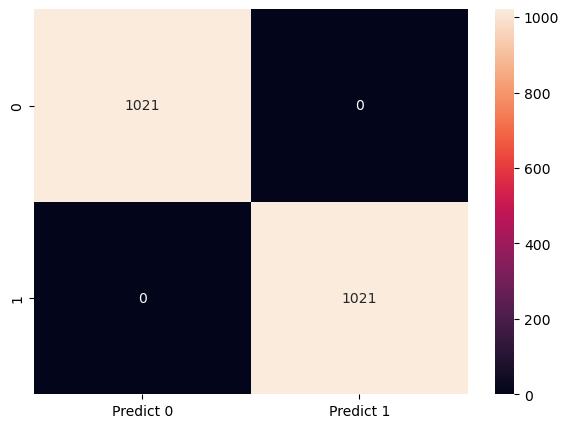

Confusion Matrix on Test data for  SVM


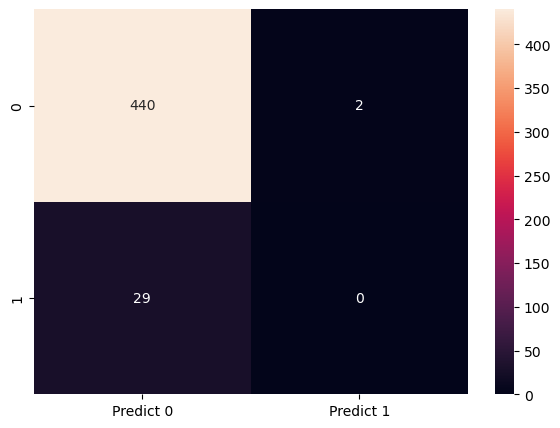

Classification  Report for the SVM on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the SVM on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.93       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.93      0.91       471

#######################################################################################

#######################################################################################

 Model DecisionTree :
Confusion Matrix on Train data for  Decisi

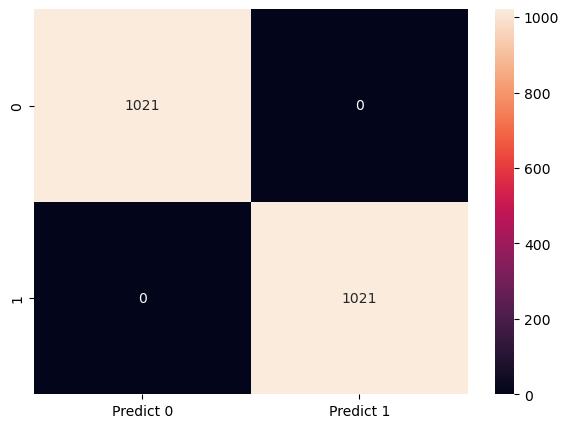

Confusion Matrix on Test data for  DecisionTree


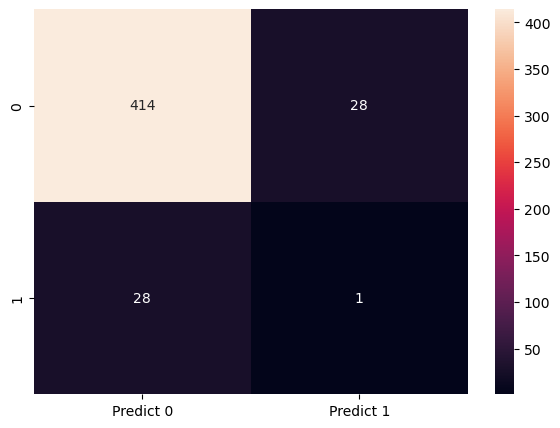

Classification  Report for the DecisionTree on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the DecisionTree on Test data:
               precision    recall  f1-score   support

           0       0.94      0.94      0.94       442
           1       0.03      0.03      0.03        29

    accuracy                           0.88       471
   macro avg       0.49      0.49      0.49       471
weighted avg       0.88      0.88      0.88       471

#######################################################################################

#######################################################################################

 Model Bagging :
Confusion Matrix on Train dat

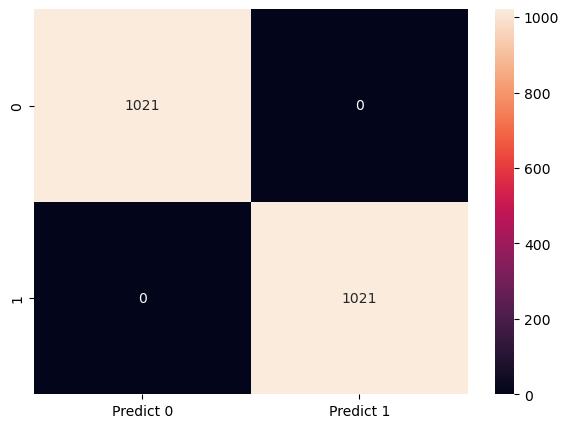

Confusion Matrix on Test data for  Bagging


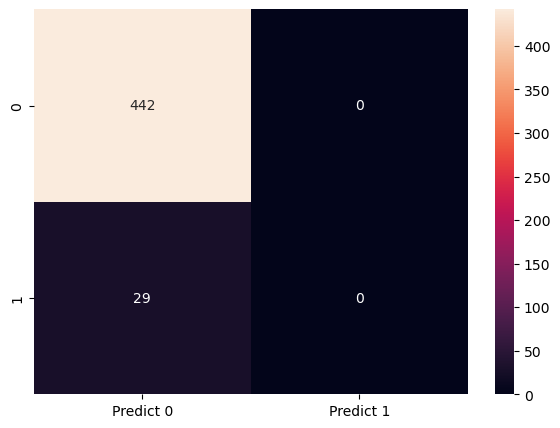

Classification  Report for the Bagging on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Bagging on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model Adaboost :
Confusion Matrix on Train data for  Ad

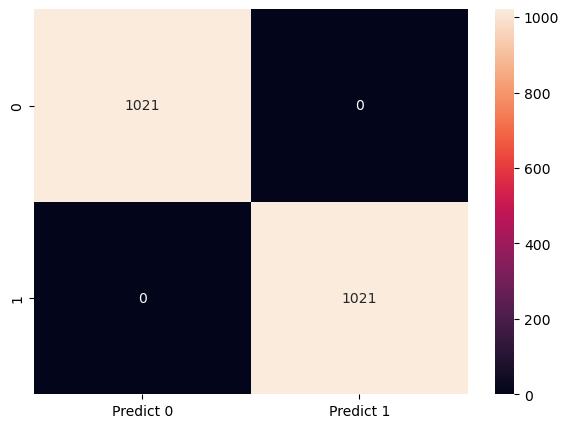

Confusion Matrix on Test data for  Adaboost


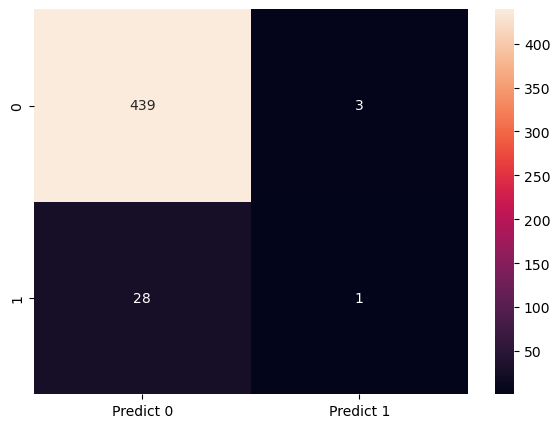

Classification  Report for the Adaboost on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Adaboost on Test data:
               precision    recall  f1-score   support

           0       0.94      0.99      0.97       442
           1       0.25      0.03      0.06        29

    accuracy                           0.93       471
   macro avg       0.60      0.51      0.51       471
weighted avg       0.90      0.93      0.91       471

#######################################################################################

#######################################################################################

 Model Gradientboost :
Confusion Matrix on Train data 

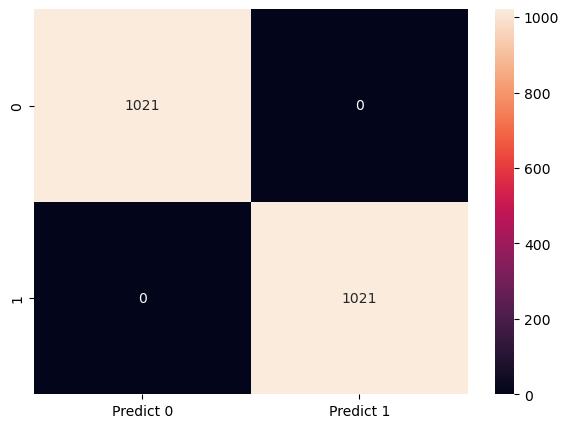

Confusion Matrix on Test data for  Gradientboost


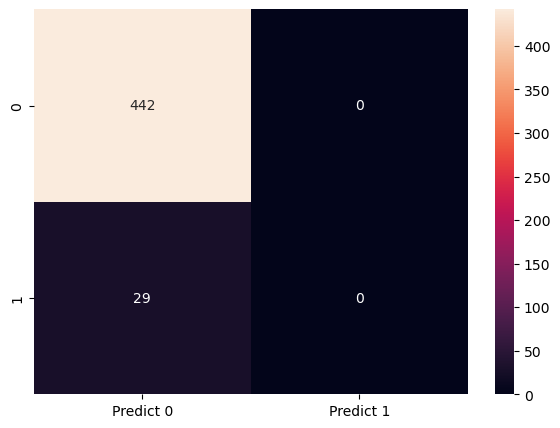

Classification  Report for the Gradientboost on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Gradientboost on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model RandomForest :
Confusion Matrix on Tr

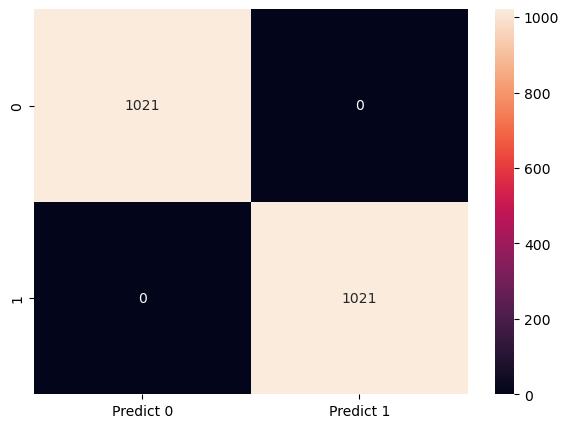

Confusion Matrix on Test data for  RandomForest


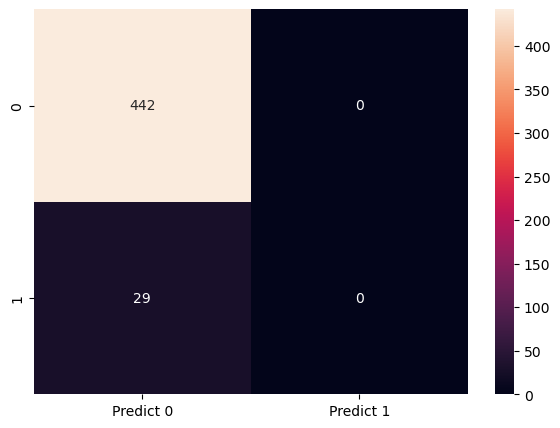

Classification  Report for the RandomForest on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the RandomForest on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

#######################################################################################

 Model LogisticRegression :
Confusion Matrix o

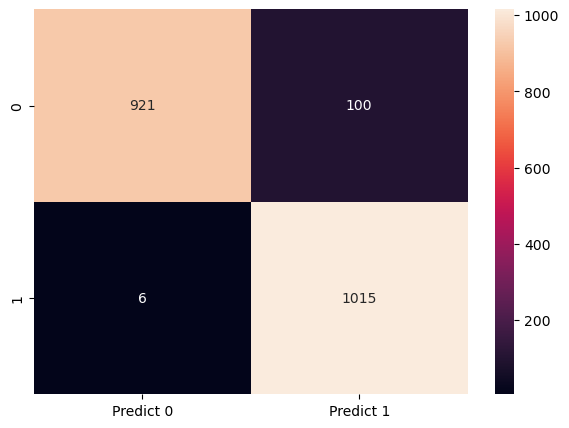

Confusion Matrix on Test data for  LogisticRegression


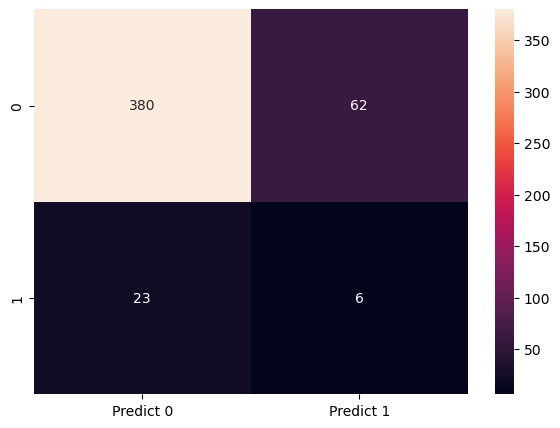

Classification  Report for the LogisticRegression on Training data:
               precision    recall  f1-score   support

           0       0.99      0.90      0.95      1021
           1       0.91      0.99      0.95      1021

    accuracy                           0.95      2042
   macro avg       0.95      0.95      0.95      2042
weighted avg       0.95      0.95      0.95      2042

Classification  Report for the LogisticRegression on Test data:
               precision    recall  f1-score   support

           0       0.94      0.86      0.90       442
           1       0.09      0.21      0.12        29

    accuracy                           0.82       471
   macro avg       0.52      0.53      0.51       471
weighted avg       0.89      0.82      0.85       471

#######################################################################################



In [140]:
train_accuracy_list=[]
train_precision_list=[]
train_recall_list=[]
train_f1score_list=[]
test_accuracy_list=[]
test_precision_list=[]
test_recall_list=[]
test_f1score_list=[]
ml=[]
pca_data_model_list=[]

for model_name, model in models:
    #Model fitting
    clf = model.fit(X_sm_train_scaled_pca, y_sm_train)
    #Predicting
    y_predict_test=model.predict(X_test_scaled_pca)
    y_predict_train=model.predict(X_sm_train_scaled_pca)
    #Train confusion matrix
    print('#######################################################################################\n')
    print('\033[1m Model',model_name,':\033[0m')
    print('Confusion Matrix on Train data for ',model_name)
    cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])
    df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_train, annot=True,fmt='g')
    _=plt.show()
    #Test Confusion Matrix
    print('Confusion Matrix on Test data for ',model_name)
    cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])
    df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_test, annot=True,fmt='g')
    _=plt.show()
    print("Classification  Report for the", model_name, "on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))
    print("Classification  Report for the", model_name, "on Test data:\n",metrics.classification_report(y_test,y_predict_test))
    test_accuracy_list.append(clf.score(X_test_scaled_pca,y_test))
    train_accuracy_list.append(clf.score(X_sm_train_scaled_pca,y_sm_train))
    train_precision_list.append(metrics.precision_score(y_sm_train,y_predict_train))
    test_precision_list.append(metrics.precision_score(y_test,y_predict_test))
    train_recall_list.append(metrics.recall_score(y_sm_train,y_predict_train))
    test_recall_list.append(metrics.recall_score(y_test,y_predict_test))
    train_f1score_list.append(metrics.f1_score(y_sm_train,y_predict_train))
    test_f1score_list.append(metrics.f1_score(y_test,y_predict_test))
    ml.append(model_name)
    pca_data_model_list.append(clf)
    print('#######################################################################################\n')

In [141]:
models_perf2 = pd.DataFrame({
    'Model Name':ml,
    'Train Accuracy': train_accuracy_list,
    'Test Accuracy': test_accuracy_list,
    'Train Precision': train_precision_list,
    'Test Precision': test_precision_list,
    'Train Recall': train_recall_list,
    'Test Recall': test_recall_list,
    'Train F1-Score': train_f1score_list,
    'Test F1-Score': test_f1score_list
})
print('Performance of Models with scaled and PCA treated values:\n')
models_perf2

Performance of Models with scaled and PCA treated values:



,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.98,0.94,1.00,0.00,0.96,0.00,0.98,0.00
1,KNeighbours,0.63,0.22,0.57,0.07,1.00,1.00,0.73,0.14
2,SVM,1.00,0.93,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,1.00,0.88,1.00,0.03,1.00,0.03,1.00,0.03
4,Bagging,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
5,Adaboost,1.00,0.93,1.00,0.25,1.00,0.03,1.00,0.06
6,Gradientboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
7,RandomForest,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
8,LogisticRegression,0.95,0.82,0.91,0.09,0.99,0.21,0.95,0.12


**Step 3: Now we'll tune the hyperparameters of these models using RandomizedSearchCV**

In [142]:
param_grid_NB = {'var_smoothing':uniform(1e-10,1e-8)             
             } 
param_grid_KNN = {'n_neighbors':[3,5,10,15,20],
                  'weights': ['uniform', 'distance'],
                  'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                  'leaf_size': [10,20,30,40,50]                  
             } 
param_grid_SVM = {'C':uniform(10,50),
                  'gamma': uniform(0.01,0.050),
                  'kernel': ['linear', 'poly', 'rbf', 'sigmoid']                  
             }
param_grid_DT = {'criterion':["gini", "entropy", "log_loss"],
                  'splitter': ["best", "random"],
                  'max_depth' : list(np.arange(4,10,1)),
                 'min_samples_split' : list(np.arange(40,80,2)),
                 'min_samples_leaf' : list(np.arange(20,30,2))                  
             }
param_grid_Bag = {'n_estimators':[5,10,15,20],
                  'max_samples': [1,2,3,4,5],
                  'max_features' : [1,3,5,8,10],
                 'bootstrap' : [True,False],
                 'bootstrap_features' : [True,False]                  
             }
param_grid_Ada = {'n_estimators':list(np.arange(50,501,50)),
                  'learning_rate': [0.01,0.1,0.5,1.0]
                  #'algorithm' : ['SAMME', 'SAMME.R']                  
             }
param_grid_GB = {'n_estimators' : list(np.arange(100,201,20)),
                 #'learning_rate' : [0.1,0.5,0.9,1.0],
                 #'subsample' :[0.1,0.5,1.0],
                 'min_samples_split' : [2,5,10,20,30,40],
                 'min_samples_leaf' : [1,10,20,30],
                 'max_depth' : [3,4,6,8],
                 'max_features' : [4,5,6,10]                 
             }
param_grid_RF = {'n_estimators' : list(np.arange(10,151,10)),
                 #'criterion' : ["gini", "entropy"],
                 'max_depth' : [4,6,8,10,12],
                 'min_samples_split' : [20,30,40,50],
                 'min_samples_leaf' : [1,5,10,20],
                 'max_features' : [4,5,6,8,10,12]
                 #'bootstrap' : [True,False]                 
             }
param_grid_LR = {'penalty':['l1', 'l2', 'elasticnet'],
                    'dual':[False,True],
                    'tol':uniform(0.0001,0.001),
                    'C':uniform(0,10),
                    'fit_intercept':[True,False],
                    'intercept_scaling':uniform(0,10),
                    #'random_state':10,
                    'solver':['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga'],
                    'class_weight':['balanced', 'None'],
                    'multi_class' : ['auto', 'ovr', 'multinomial'],
                    'warm_start' : [True, False]
                }
param_grid=[param_grid_NB,param_grid_KNN,param_grid_SVM,param_grid_DT,param_grid_Bag,param_grid_Ada,param_grid_GB,param_grid_RF,param_grid_LR]
name_list = ['NaiveBayes','KNeighbours','SVM','DecisionTree','Bagging','Adaboost','Gradientboost','RandomForest','LogisticRegression']
ml_list = [GaussianNB(),KNeighborsClassifier(),SVC(),DecisionTreeClassifier(),BaggingClassifier(),AdaBoostClassifier(),GradientBoostingClassifier(),RandomForestClassifier(),LogisticRegression()]

#######################################################################################

 Model NaiveBayes :
Fitting 10 folds for each of 1000 candidates, totalling 10000 fits


RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=GaussianNB(), n_iter=1000, n_jobs=-1,
                   param_distributions={'var_smoothing': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A083E837C0>},
                   verbose=3)

0.9770205643232904

Confusion Matrix on Train data for  NaiveBayes


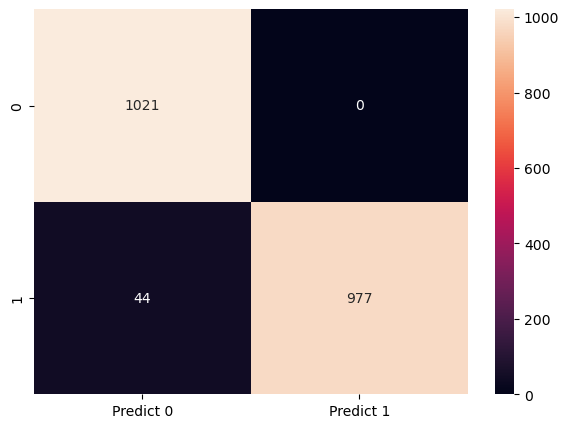

Confusion Matrix on Test data for  NaiveBayes


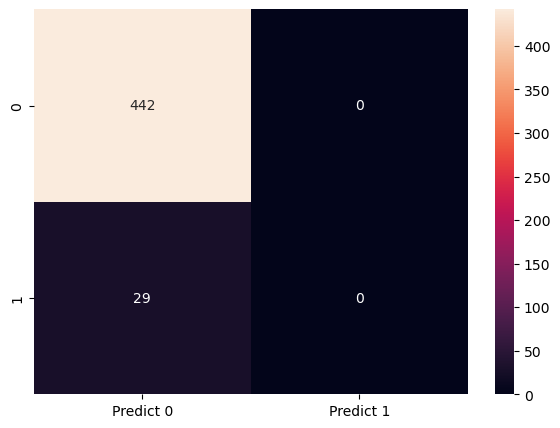

Classification  Report for the NaiveBayes on Training data:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98      1021
           1       1.00      0.96      0.98      1021

    accuracy                           0.98      2042
   macro avg       0.98      0.98      0.98      2042
weighted avg       0.98      0.98      0.98      2042

Classification  Report for the NaiveBayes on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

NaiveBayes Tuning time in minutes:  0.8965383291244506
####################################################################################

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=KNeighborsClassifier(), n_iter=1000, n_jobs=-1,
                   param_distributions={'algorithm': ['auto', 'ball_tree',
                                                      'kd_tree', 'brute'],
                                        'leaf_size': [10, 20, 30, 40, 50],
                                        'n_neighbors': [3, 5, 10, 15, 20],
                                        'weights': ['uniform', 'distance']},
                   verbose=3)

0.6023601147776183

Confusion Matrix on Train data for  KNeighbours


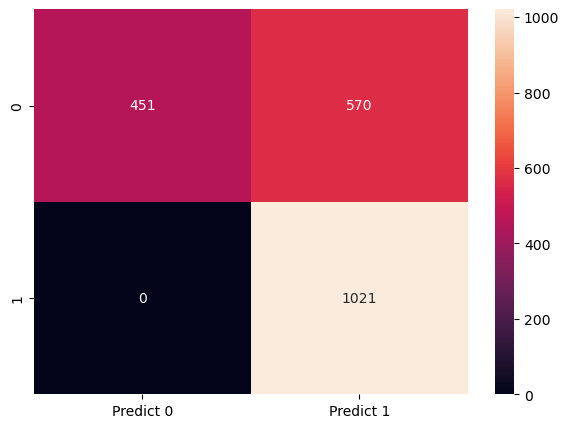

Confusion Matrix on Test data for  KNeighbours


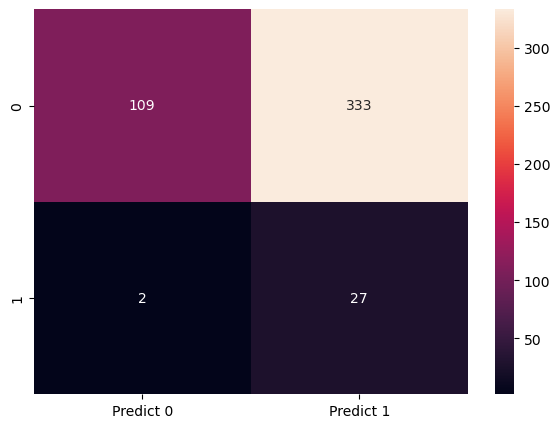

Classification  Report for the KNeighbours on Training data:
               precision    recall  f1-score   support

           0       1.00      0.44      0.61      1021
           1       0.64      1.00      0.78      1021

    accuracy                           0.72      2042
   macro avg       0.82      0.72      0.70      2042
weighted avg       0.82      0.72      0.70      2042

Classification  Report for the KNeighbours on Test data:
               precision    recall  f1-score   support

           0       0.98      0.25      0.39       442
           1       0.07      0.93      0.14        29

    accuracy                           0.29       471
   macro avg       0.53      0.59      0.27       471
weighted avg       0.93      0.29      0.38       471

#######################################################################################

KNeighbours Tuning time in minutes:  1.1343401551246644
#################################################################################

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=SVC(), n_iter=1000, n_jobs=-1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A085B48190>,
                                        'gamma': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A083E81420>,
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   verbose=3)

0.9970588235294118

Confusion Matrix on Train data for  SVM


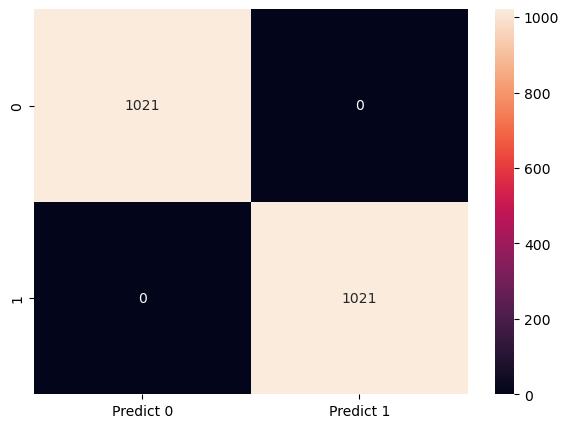

Confusion Matrix on Test data for  SVM


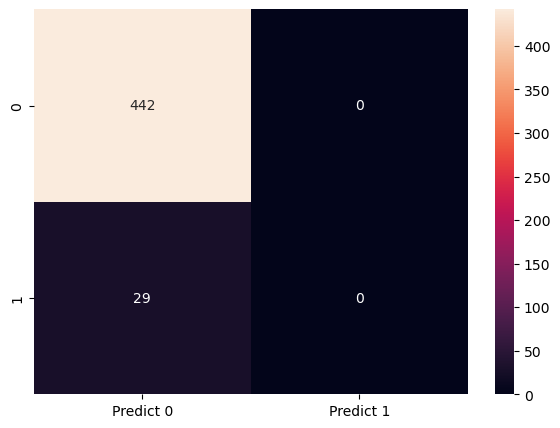

Classification  Report for the SVM on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the SVM on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

SVM Tuning time in minutes:  35.21112550099691
#######################################################################################

 Model DecisionTr

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=DecisionTreeClassifier(), n_iter=1000, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': [4, 5, 6, 7, 8, 9],
                                        'min_samples_leaf': [20, 22, 24, 26,
                                                             28],
                                        'min_samples_split': [40, 42, 44, 46,
                                                              48, 50, 52, 54,
                                                              56, 58, 60, 62,
                                                              64, 66, 68, 70,
                                                              72, 74, 76, 78],
                                        'splitter': ['best', 'random']},
                   verbose=3)

0.9407532281205165

Confusion Matrix on Train data for  DecisionTree


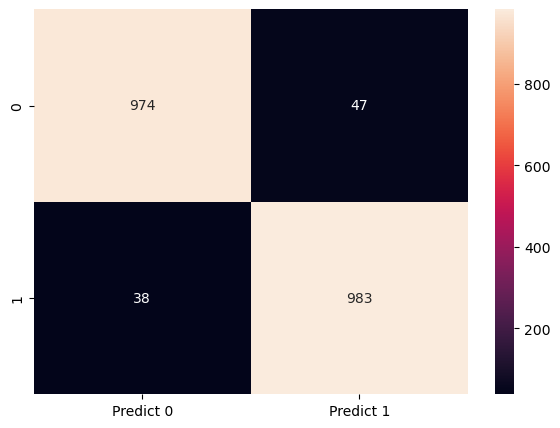

Confusion Matrix on Test data for  DecisionTree


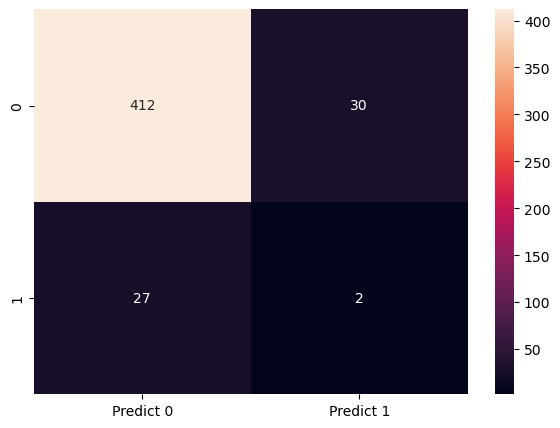

Classification  Report for the DecisionTree on Training data:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96      1021
           1       0.95      0.96      0.96      1021

    accuracy                           0.96      2042
   macro avg       0.96      0.96      0.96      2042
weighted avg       0.96      0.96      0.96      2042

Classification  Report for the DecisionTree on Test data:
               precision    recall  f1-score   support

           0       0.94      0.93      0.94       442
           1       0.06      0.07      0.07        29

    accuracy                           0.88       471
   macro avg       0.50      0.50      0.50       471
weighted avg       0.88      0.88      0.88       471

#######################################################################################

DecisionTree Tuning time in minutes:  6.055913897355397
###############################################################################

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=BaggingClassifier(), n_iter=1000, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'bootstrap_features': [True, False],
                                        'max_features': [1, 3, 5, 8, 10],
                                        'max_samples': [1, 2, 3, 4, 5],
                                        'n_estimators': [5, 10, 15, 20]},
                   verbose=3)

0.6865925394548062

Confusion Matrix on Train data for  Bagging


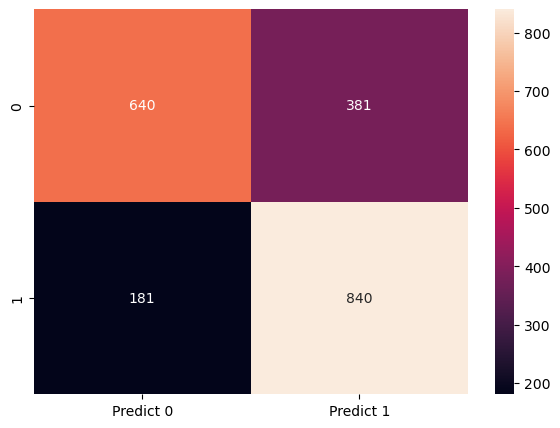

Confusion Matrix on Test data for  Bagging


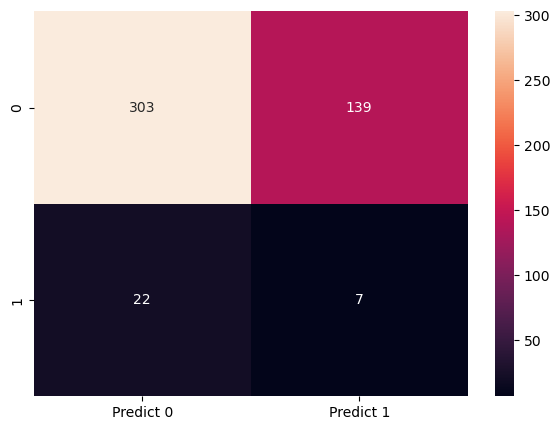

Classification  Report for the Bagging on Training data:
               precision    recall  f1-score   support

           0       0.78      0.63      0.69      1021
           1       0.69      0.82      0.75      1021

    accuracy                           0.72      2042
   macro avg       0.73      0.72      0.72      2042
weighted avg       0.73      0.72      0.72      2042

Classification  Report for the Bagging on Test data:
               precision    recall  f1-score   support

           0       0.93      0.69      0.79       442
           1       0.05      0.24      0.08        29

    accuracy                           0.66       471
   macro avg       0.49      0.46      0.44       471
weighted avg       0.88      0.66      0.75       471

#######################################################################################

Bagging Tuning time in minutes:  0.6828434348106385
#######################################################################################

 Mod

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=AdaBoostClassifier(), n_iter=1000, n_jobs=-1,
                   param_distributions={'learning_rate': [0.01, 0.1, 0.5, 1.0],
                                        'n_estimators': [50, 100, 150, 200, 250,
                                                         300, 350, 400, 450,
                                                         500]},
                   verbose=3)

0.9990243902439024

Confusion Matrix on Train data for  Adaboost


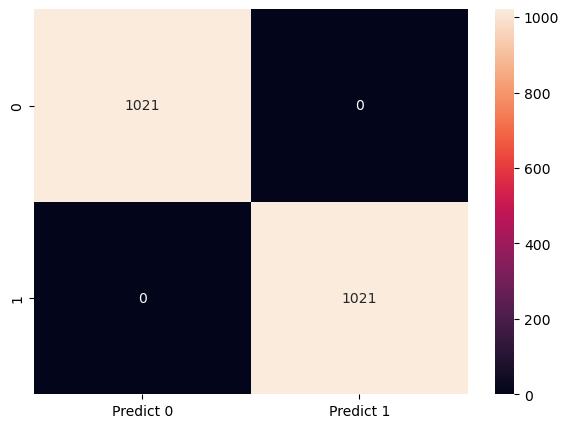

Confusion Matrix on Test data for  Adaboost


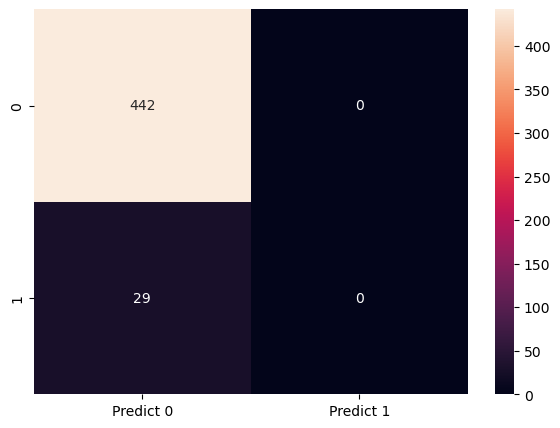

Classification  Report for the Adaboost on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Adaboost on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

Adaboost Tuning time in minutes:  29.29939581155777
#######################################################################################

 M

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=GradientBoostingClassifier(), n_iter=1000,
                   n_jobs=-1,
                   param_distributions={'max_depth': [3, 4, 6, 8],
                                        'max_features': [4, 5, 6, 10],
                                        'min_samples_leaf': [1, 10, 20, 30],
                                        'min_samples_split': [2, 5, 10, 20, 30,
                                                              40],
                                        'n_estimators': [100, 120, 140, 160,
                                                         180, 200]},
                   verbose=3)

1.0

Confusion Matrix on Train data for  Gradientboost


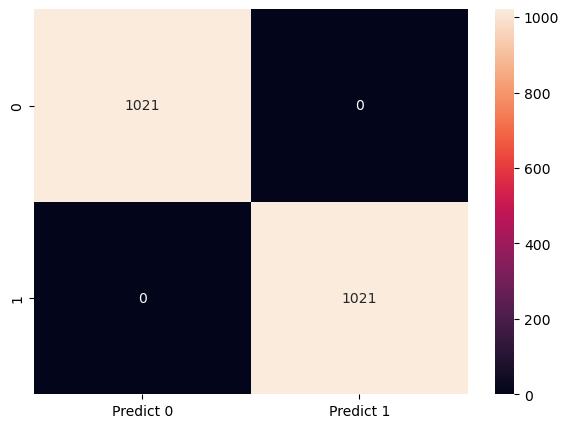

Confusion Matrix on Test data for  Gradientboost


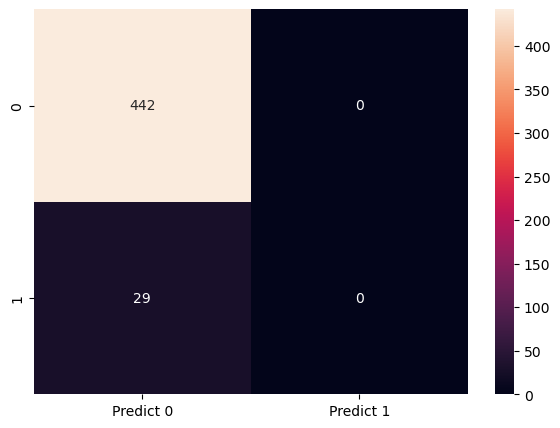

Classification  Report for the Gradientboost on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the Gradientboost on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

Gradientboost Tuning time in minutes:  76.27370267709097
############################################################################

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=RandomForestClassifier(), n_iter=1000, n_jobs=-1,
                   param_distributions={'max_depth': [4, 6, 8, 10, 12],
                                        'max_features': [4, 5, 6, 8, 10, 12],
                                        'min_samples_leaf': [1, 5, 10, 20],
                                        'min_samples_split': [20, 30, 40, 50],
                                        'n_estimators': [10, 20, 30, 40, 50, 60,
                                                         70, 80, 90, 100, 110,
                                                         120, 130, 140, 150]},
                   verbose=3)

0.997556193208991

Confusion Matrix on Train data for  RandomForest


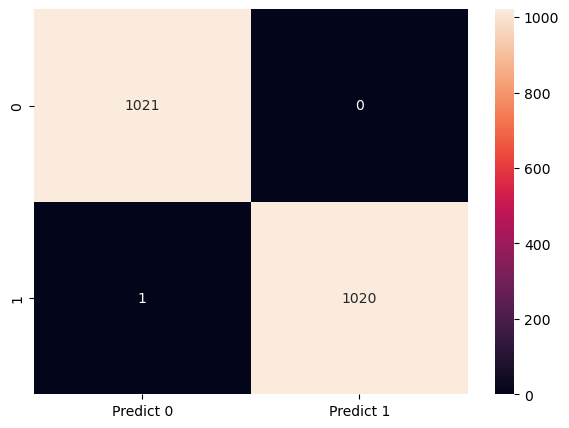

Confusion Matrix on Test data for  RandomForest


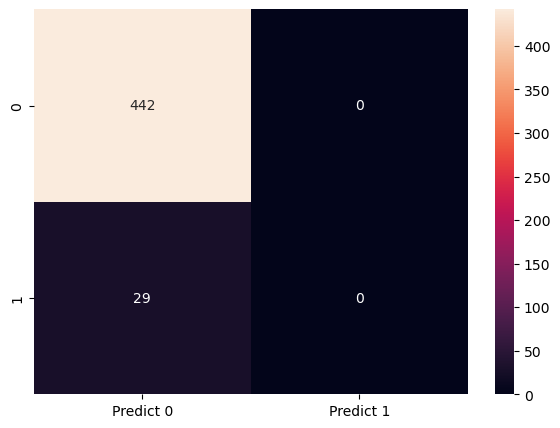

Classification  Report for the RandomForest on Training data:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1021
           1       1.00      1.00      1.00      1021

    accuracy                           1.00      2042
   macro avg       1.00      1.00      1.00      2042
weighted avg       1.00      1.00      1.00      2042

Classification  Report for the RandomForest on Test data:
               precision    recall  f1-score   support

           0       0.94      1.00      0.97       442
           1       0.00      0.00      0.00        29

    accuracy                           0.94       471
   macro avg       0.47      0.50      0.48       471
weighted avg       0.88      0.94      0.91       471

#######################################################################################

RandomForest Tuning time in minutes:  42.372252853711444
##############################################################################

RandomizedSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
                   estimator=LogisticRegression(), n_iter=1000, n_jobs=-1,
                   param_distributions={'C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A083E83970>,
                                        'class_weight': ['balanced', 'None'],
                                        'dual': [False, True],
                                        'fit_intercept': [True, False],
                                        'intercept_scaling': <s...s._distn_infrastructure.rv_continuous_frozen object at 0x000001A085B48730>,
                                        'multi_class': ['auto', 'ovr',
                                                        'multinomial'],
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['lbfgs', 'liblinear',
                                                   'newton-cg',
                                                   'newton-cholesky', 'sag',
                                                   'saga'],
                                        'tol': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001A085B482B0>,
                                        'warm_start': [True, False]},
                   verbose=3)

0.9387709230033476

Confusion Matrix on Train data for  LogisticRegression


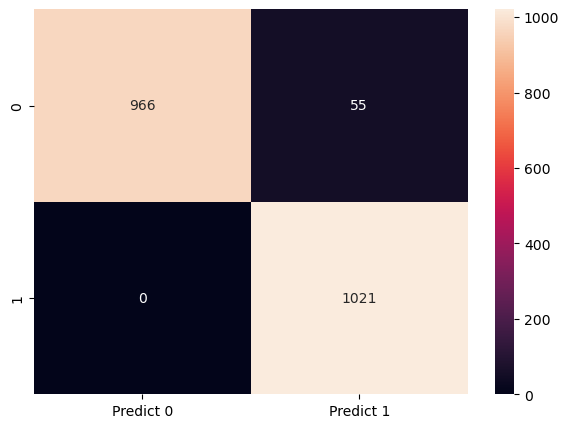

Confusion Matrix on Test data for  LogisticRegression


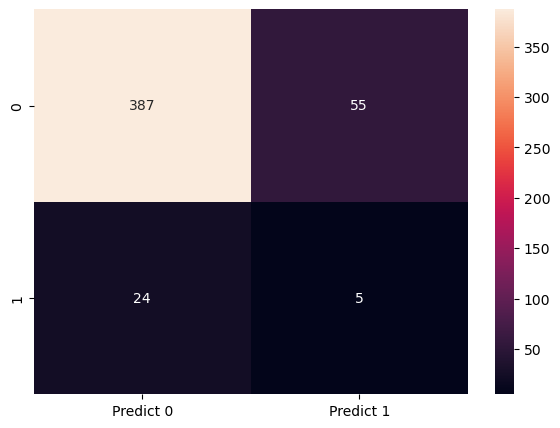

Classification  Report for the LogisticRegression on Training data:
               precision    recall  f1-score   support

           0       1.00      0.95      0.97      1021
           1       0.95      1.00      0.97      1021

    accuracy                           0.97      2042
   macro avg       0.97      0.97      0.97      2042
weighted avg       0.97      0.97      0.97      2042

Classification  Report for the LogisticRegression on Test data:
               precision    recall  f1-score   support

           0       0.94      0.88      0.91       442
           1       0.08      0.17      0.11        29

    accuracy                           0.83       471
   macro avg       0.51      0.52      0.51       471
weighted avg       0.89      0.83      0.86       471

#######################################################################################

LogisticRegression Tuning time in minutes:  1.59634241660436
Total time in minutes:  193.52247659365335


In [143]:
train_accuracy_list=[]
train_precision_list=[]
train_recall_list=[]
train_f1score_list=[]
test_accuracy_list=[]
test_precision_list=[]
test_recall_list=[]
test_f1score_list=[]
ml=[]
tuned_model_list = []

import time
start1=time.time()

for model_name, model, pg in zip(name_list,ml_list,param_grid):
    #Model fitting
    print('#######################################################################################\n')
    print('\033[1m Model',model_name,':\033[0m')
    start2=time.time()
    clf = RandomizedSearchCV(model, pg, cv=skf, verbose = 3, n_iter=1000, n_jobs=-1)
    #Fitting the model
    clf.fit(X_sm_train_scaled_pca, y_sm_train)
    clf.best_score_
    #Predicting
    y_predict_test=clf.predict(X_test_scaled_pca)
    y_predict_train=clf.predict(X_sm_train_scaled_pca)
    #Train confusion matrix    
    
    print('Confusion Matrix on Train data for ',model_name)
    cm=metrics.confusion_matrix(y_sm_train, y_predict_train, labels=[0,1])
    df_cm_train = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_train, annot=True,fmt='g')
    _=plt.show()
    #Test Confusion Matrix
    print('Confusion Matrix on Test data for ',model_name)
    cm=metrics.confusion_matrix(y_test, y_predict_test, labels=[0,1])
    df_cm_test = pd.DataFrame(cm, index = [i for i in ["0","1"]],
                  columns = [i for i in ["Predict 0","Predict 1"]])
    _=plt.figure(figsize = (7,5))
    _=sns.heatmap(df_cm_test, annot=True,fmt='g')
    _=plt.show()
    print("Classification  Report for the", model_name, "on Training data:\n",metrics.classification_report(y_sm_train,y_predict_train))
    print("Classification  Report for the", model_name, "on Test data:\n",metrics.classification_report(y_test,y_predict_test))
    test_accuracy_list.append(clf.score(X_test_scaled_pca,y_test))
    train_accuracy_list.append(clf.score(X_sm_train_scaled_pca,y_sm_train))
    train_precision_list.append(metrics.precision_score(y_sm_train,y_predict_train))
    test_precision_list.append(metrics.precision_score(y_test,y_predict_test))
    train_recall_list.append(metrics.recall_score(y_sm_train,y_predict_train))
    test_recall_list.append(metrics.recall_score(y_test,y_predict_test))
    train_f1score_list.append(metrics.f1_score(y_sm_train,y_predict_train))
    test_f1score_list.append(metrics.f1_score(y_test,y_predict_test))
    ml.append(model_name)
    tuned_model_list.append(clf)
    print('#######################################################################################\n')
    end2=time.time()
    print(model_name, 'Tuning time in minutes: ',(end2-start2)/60)

end1=time.time()
print('Total time in minutes: ',(end1-start1)/60)

In [144]:
models_perf3 = pd.DataFrame({
    'Model Name':ml,
    'Train Accuracy': train_accuracy_list,
    'Test Accuracy': test_accuracy_list,
    'Train Precision': train_precision_list,
    'Test Precision': test_precision_list,
    'Train Recall': train_recall_list,
    'Test Recall': test_recall_list,
    'Train F1-Score': train_f1score_list,
    'Test F1-Score': test_f1score_list
})
print('Performance of Models after Hyperparameter tuning using RandomizedSearchCV, with scaled and PCA treated values:\n')
models_perf3

Performance of Models after Hyperparameter tuning using RandomizedSearchCV, with scaled and PCA treated values:



,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.98,0.94,1.00,0.00,0.96,0.00,0.98,0.00
1,KNeighbours,0.72,0.29,0.64,0.07,1.00,0.93,0.78,0.14
2,SVM,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,0.96,0.88,0.95,0.06,0.96,0.07,0.96,0.07
4,Bagging,0.72,0.66,0.69,0.05,0.82,0.24,0.75,0.08
5,Adaboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
6,Gradientboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
7,RandomForest,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
8,LogisticRegression,0.97,0.83,0.95,0.08,1.00,0.17,0.97,0.11


In [145]:
import dill
filename = 'FMT_Project_bkup.pkl'
dill.dump_session(filename)

**Performance parameters of models trained on scaled data:**

In [146]:
models_perf1

,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.91,0.90,0.95,0.12,0.86,0.10,0.91,0.11
1,KNeighbours,0.56,0.15,0.53,0.07,1.00,1.00,0.70,0.13
2,SVM,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,1.00,0.81,1.00,0.11,1.00,0.31,1.00,0.17
4,Bagging,1.00,0.90,1.00,0.10,1.00,0.07,1.00,0.08
5,Adaboost,0.98,0.89,0.97,0.12,0.98,0.14,0.98,0.13
6,Gradientboost,1.00,0.90,1.00,0.05,1.00,0.03,1.00,0.04
7,RandomForest,1.00,0.94,1.00,0.50,1.00,0.03,1.00,0.06
8,LogisticRegression,0.97,0.80,0.94,0.08,1.00,0.21,0.97,0.12


**Performance parameters of models trained on scaled and PCA data:**

In [147]:
models_perf2

,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.98,0.94,1.00,0.00,0.96,0.00,0.98,0.00
1,KNeighbours,0.63,0.22,0.57,0.07,1.00,1.00,0.73,0.14
2,SVM,1.00,0.93,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,1.00,0.88,1.00,0.03,1.00,0.03,1.00,0.03
4,Bagging,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
5,Adaboost,1.00,0.93,1.00,0.25,1.00,0.03,1.00,0.06
6,Gradientboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
7,RandomForest,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
8,LogisticRegression,0.95,0.82,0.91,0.09,0.99,0.21,0.95,0.12


**Performance parameters of models trained on scaled and PCA data after Hyperparameter tuning with RandomizedSearchCV:**

In [148]:
models_perf3

,Model Name,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,NaiveBayes,0.98,0.94,1.00,0.00,0.96,0.00,0.98,0.00
1,KNeighbours,0.72,0.29,0.64,0.07,1.00,0.93,0.78,0.14
2,SVM,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
3,DecisionTree,0.96,0.88,0.95,0.06,0.96,0.07,0.96,0.07
4,Bagging,0.72,0.66,0.69,0.05,0.82,0.24,0.75,0.08
5,Adaboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
6,Gradientboost,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
7,RandomForest,1.00,0.94,1.00,0.00,1.00,0.00,1.00,0.00
8,LogisticRegression,0.97,0.83,0.95,0.08,1.00,0.17,0.97,0.11


**Observations**:
- The performance of most of the models improved slightly when we used scaled and transformed the data with PCA, when compared to using only the scaled data
- Performance of some models improved even further when we tuned the Hyperparameters with RandomizedSearchCV (For ex. KNN, SVM)
- Performance of some models deteriorated after hyperparameter tuning (Bagging). This maybe because appropriate set of hyper parameter sample space was not provided, and can be improved if we try with a larger sample space

We experimented using various techniques to identify the best possible model, like:
- upsampling with SMOTE
- downsampling with Cluster Centroids
- Scaling using MinMaxScalar
- Scaling using StandardScalar
- Pipeline
- Hyperparameter Tuning
- Outlier removal
- Multi - Collinearity removal
- PCA transformation


However, we have not been able to tune a model having an allround performance parameters (Accuracy, Precision, Recall and F1-Score). Many models have been able to achieve excellent accuracy on train and test data, but the Precision, Recall and F1-Score of these model is poor. This maybe because we have trained the Scaling function on the train data and then used it to fit the test data to avoid data leak. Also, the data was very unbalanced and we used SMOTE/Cluster Centroids to balance the data. The balanced train data may not have captured all the predicting conditions for a Fail result.


Based on the performance parameters described above, in my opinion the hyperparameter tuned **Naive Bayes** model has performed the best due to the following reasons:
- It has a train data accuracy of 98% and test data accuracy of 94%. The difference between these is within 5%, which means its not an overfit model and the model has generalized very well.
- The duration required for tuning the hyperparameters of this model is also not huge, so it is possible to train the model and deploy quickly.
- Recall, Precision and F1-Score of the model on test data is not good, but since the requirement is achieve best accuracy we can consider this model for making the predictions

If Predicting Fail condition is priority, we need to consider a model with good Recall value. If good recall is needed, we can consider the hyperparameter tuned **KNN** model.
- The KNN model doesnt have good accuracy score, but its Train and Test Recall is 100% and 93% respectively, which is very good

**We'll pickle both Naive Bayes and KNN models**

In [149]:
import pickle
pickle.dump(tuned_model_list[0], open('tuned_NB_model.pkl', 'wb'))
pickle.dump(tuned_model_list[1], open('tuned_KNN_model.pkl', 'wb'))

**Based on the various aspects analyzed as part of this project we can conclude as below:**
- Real life data may not be clean and usable directly and multiple pre-processing steps may be required before the data can be used for training of models
    - There maybe missing and incorrect data, which needs to be handled
    - There maybe features which have no variance
    - There maybe features which have very high correlation
    - There maybe outliers in the data which maybe incorrect
    - The data maybe highly unbalanced
- All these aspects needs to be considered as part of data pre-processing before the model is built
    - Missing and incorrect data points need to be imputed with appropriate values
    - Features having no variance need to be dropped, as these do not contribute to model training
    - Data features having very high correlation need to be handled by either dropping them or applying PCA treatment
    - Outliers need to be treated using suitable approach of replacing with Mean/Median or other suiatble values
    - Data needs to be balanced for all classes to be predicted
- Scaling of data is needed as well, because the data features are at different scales and some models like KNN may not train well with such data
- If the dataset is highly unbalanced, then balancing of the data using oversampling or undersampling methods is required as well
- Highly correlated features can be found using the correlation matrix, and one of the correlated features can be dropped.
- However, to ensure that the dataset is rid of correlation, while capturing maximum variance in the data PCA can be used
- Models built using PCA tend to be better with high accuracy
- Performance parameters of the models can be improved even further by tuning the hyperparameters using RandomizedSearchCV or GridSearchCV
- It is also important to try out various models, balancing and scaling techniques to achieve the best possible performance
- In our example we saw, we achieved the best generalized model using the Naive Bayes model